# **Sepsis Data Challenge- Exploratory Data Analysis**

*importing the dataset and necesary libraries*

In this step, we import the necessary Python libraries needed for data handling, visualization, and machine learning preprocessing.


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats


# Load the data
df = pd.read_excel(r'c:\Users\820 g4\VSCODE PYTHON PROJECTS\Sepsis Prediction Project\Infant Sepsis Data(1).xlsx')

In [3]:
df1 = df.copy()

*basic data exploration*

In [3]:
# Basic data exploration
# Data types and missing values
print("Data types and missing values:")
print(df1.dtypes)
print("\nMissing values per column:")
print(df1.isnull().sum().sort_values(ascending=False))

# Summary statistics for numeric columns
print("\nDescriptive statistics (numeric features):")
print(df1.describe())

# Unique values per column
print("\nUnique values per column:")
print(df1.nunique().sort_values(ascending=True))

print(f"Total number of patients: {len(df1)}")
print(f"Number of columns: {len(df1.columns)}")

Data types and missing values:
studyid_adm               int64
agecalc_adm             float64
height_cm_adm           float64
weight_kg_adm           float64
muac_mm_adm             float64
                         ...   
hivstatus_adm            object
malariastatuspos_adm     object
lengthadm                 int64
caregiver_adm_new        object
inhospital_mortality      int64
Length: 138, dtype: object

Missing values per column:
nonexclbreastfed_adm     2603
spo2other_adm            2505
lactate2_mmolpl_adm      2217
vaccmeaslessource_adm     946
lactate_mmolpl_adm        464
                         ... 
cookfuel_adm___5            0
cookfuel_adm___3            0
tobacco_adm                 0
lengthadm                   0
inhospital_mortality        0
Length: 138, dtype: int64

Descriptive statistics (numeric features):
       studyid_adm  agecalc_adm  height_cm_adm  weight_kg_adm  muac_mm_adm  \
count  2686.000000   2686.00000    2672.000000    2677.000000  2673.000000   
mean  

*dropping of intervention columns unnecessary to the project*

In [4]:
# Define the admitabx intervention columns explicitly
admitabx_cols = [f"admitabx_adm___{i}" for i in range(1, 22)]

# Drop those columns from the DataFrame
df1 = df1.drop(columns=admitabx_cols)

# Show the updated column count
remaining_columns = df1.columns.tolist()
remaining_columns[:10], len(remaining_columns)  # Preview a few and total count

# Check new shape
print(f"Shape after dropping admitabx columns: {df1.shape}")

Shape after dropping admitabx columns: (2686, 117)


*checking for duplicate rows*


In [5]:
# Check for total number of duplicate rows
num_duplicates = df1.duplicated().sum()
print(f"Total duplicate rows: {num_duplicates}")

# Optionally, display duplicate rows (if any)
if num_duplicates > 0:
    duplicates_df = df1[df1.duplicated()]
    display(duplicates_df)


Total duplicate rows: 0


## **EDA PART ONE**

### Summary Statitics, Data Types and Visualisations

In [6]:
# Summary statistics (numeric and categorical)
df1.describe(include='all').T

# Summary statistics for numerical variables
numerical_cols = ['agecalc_adm', 'height_cm_adm', 'weight_kg_adm', 'muac_mm_adm', 
                 'hr_bpm_adm', 'rr_brpm_app_adm', 'sysbp_mmhg_adm', 'diasbp_mmhg_adm', 
                 'temp_c_adm', 'spo2site1_pc_oxi_adm', 'spo2site2_pc_oxi_adm']
print("\nSummary statistics for numerical variables:")
print(df1[numerical_cols].describe())


Summary statistics for numerical variables:
       agecalc_adm  height_cm_adm  weight_kg_adm  muac_mm_adm   hr_bpm_adm  \
count   2686.00000    2672.000000    2677.000000  2673.000000  2685.000000   
mean      21.12338      79.659401       9.577265   138.076693   141.219367   
std       13.05725      11.110075       2.796121    15.934621    25.550612   
min        5.90000      56.000000       2.610000    75.000000    42.000000   
25%       10.52500      71.500000       7.640000   130.000000   128.000000   
50%       16.90000      78.000000       9.000000   140.000000   143.000000   
75%       28.67500      86.700000      11.000000   149.000000   158.000000   
max       61.80000     122.000000      22.000000   190.000000   214.000000   

       rr_brpm_app_adm  sysbp_mmhg_adm  diasbp_mmhg_adm   temp_c_adm  \
count      2681.000000     2684.000000      2685.000000  2685.000000   
mean         46.179784       96.941133        54.594041    37.470503   
std          14.871732       11.8769

### 📊 Summary Statistics Analysis (Numerical Variables)

#### 🔍 General Observations
- **Sample Size**: Most variables have ~2680 non-null values, indicating only minor missingness.
- **Units**: Appear appropriate for pediatric data (e.g., weight in kg, temperature in °C, BP in mmHg).
- **No obvious data entry errors**, but some ranges may warrant closer inspection.

---

#### 🔎 Key Insights Per Variable

##### `agecalc_adm` (likely age in months or weeks)
- **Range**: 5.9 to 61.8
- **Distribution**: Right-skewed (mean 21.1 > median 16.9)
- 📌 **Note**: Confirm the unit — could be weeks or months.

##### Growth Indicators
- **`height_cm_adm`**: 56 to 122 cm – normal for pediatric population; upper outliers may indicate older children.
- **`weight_kg_adm`**: 2.61 to 22 kg – wide but acceptable range.
- **`muac_mm_adm`**: 75 to 190 mm
  - ⚠️ Very high MUAC values; normal MUAC is around 115 mm for infants.
  - Might indicate unit error (should be in **cm**?).

##### Vital Signs
- **`hr_bpm_adm`** (heart rate): 42 to 214 bpm
  - Very wide; potential outliers or critical illness.
- **`rr_brpm_app_adm`** (respiratory rate): 17 to 116 breaths/min
  - Also wide; values >60 may be outliers or indicate respiratory distress.

##### Blood Pressure
- **`sysbp_mmhg_adm`**: 58 to 159 mmHg  
- **`diasbp_mmhg_adm`**: 15 to 103 mmHg  
  - Wide but clinically plausible for infants/children.

##### Temperature
- **`temp_c_adm`**: 33.6 to 40.6 °C
  - Within expected range. Low values (<35°C) may indicate hypothermia.

##### Oxygen Saturation
- **`spo2site1_pc_oxi_adm`**: 57–100%
- **`spo2site2_pc_oxi_adm`**: 57–99%
  - Some low values (<90%) suggest hypoxia.
  - `spo2site2` has fewer observations (2481 vs. 2682) — consider how to handle missing data.

---

#### 📌 Next Steps
- 📈 **Visualize distributions** (e.g., histograms, boxplots) to check skewness and outliers.
- ⚠️ **Verify units** (especially for MUAC and age).
- 🚩 **Flag and handle outliers** as needed.
- ❓ Consult clinical knowledge for interpreting extreme values — are they real or input errors?


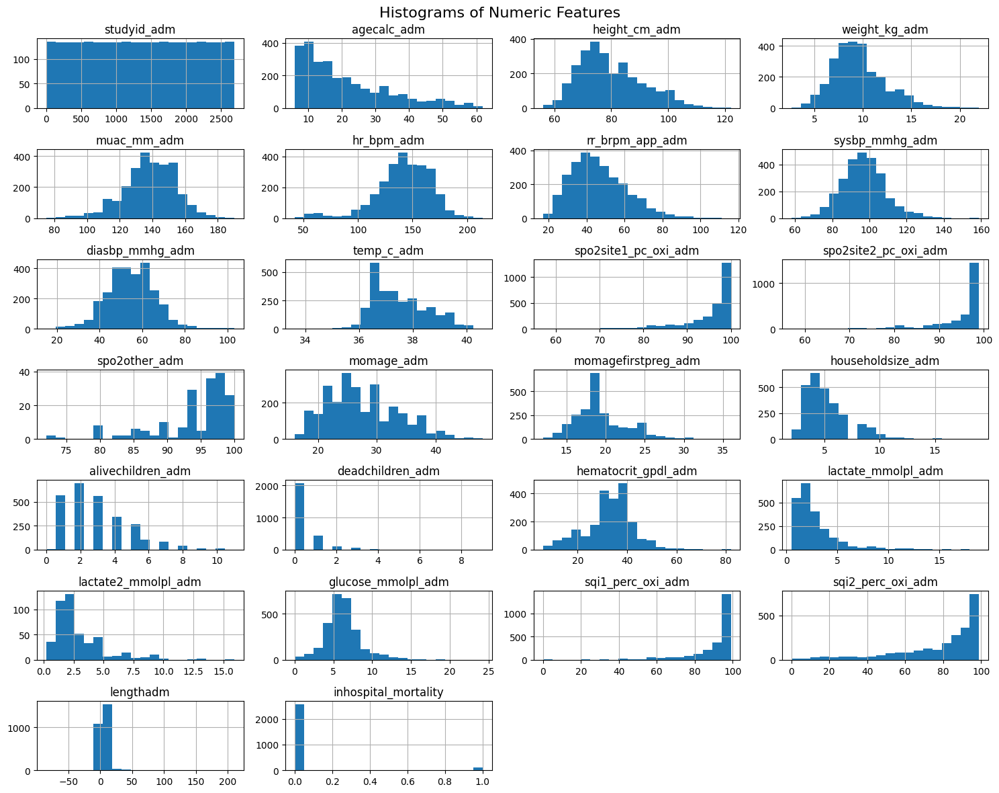

In [7]:
numeric_cols = df1.select_dtypes(include=['int64', 'float64']).columns

df1[numeric_cols].hist(bins=20, figsize=(15, 12), layout=(7, 4))
plt.suptitle("Histograms of Numeric Features", fontsize=16)
plt.tight_layout()
plt.show()


*boxplots of numeric columns*

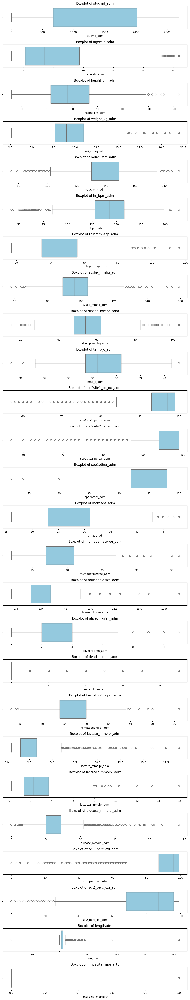

In [11]:
# Filter only numeric columns
numeric_cols = df1.select_dtypes(include=['number']).columns

# Set up the figure
plt.figure(figsize=(10, len(numeric_cols) * 2))

# Loop through and plot each numeric column
for i, col in enumerate(numeric_cols, 1):
    plt.subplot(len(numeric_cols), 1, i)
    sns.boxplot(x=df1[col], color='skyblue')
    plt.title(f'Boxplot of {col}', fontsize=12)
    plt.tight_layout()

plt.show()


In [9]:
Q1 = df1[numeric_cols].quantile(0.25)
Q3 = df1[numeric_cols].quantile(0.75)
IQR = Q3 - Q1

# Define outliers
is_outlier = (df1[numeric_cols] < (Q1 - 1.5 * IQR)) | (df1[numeric_cols] > (Q3 + 1.5 * IQR))

# Count outliers per column
outlier_counts_iqr = is_outlier.sum().sort_values(ascending=False)
outlier_counts_iqr[outlier_counts_iqr > 0]


deadchildren_adm        623
sqi1_perc_oxi_adm       260
spo2site2_pc_oxi_adm    234
lengthadm               233
spo2site1_pc_oxi_adm    200
glucose_mmolpl_adm      199
lactate_mmolpl_adm      145
sqi2_perc_oxi_adm       137
inhospital_mortality    119
hr_bpm_adm              101
householdsize_adm        99
muac_mm_adm              78
alivechildren_adm        71
sysbp_mmhg_adm           55
momagefirstpreg_adm      53
weight_kg_adm            50
agecalc_adm              44
hematocrit_gpdl_adm      42
diasbp_mmhg_adm          39
rr_brpm_app_adm          30
lactate2_mmolpl_adm      26
momage_adm               22
height_cm_adm            18
spo2other_adm            11
temp_c_adm                4
dtype: int64

my conclusion is that the outliers reflect real meaningful extreme cases in the clinical data, there is no need to standardise the data yet

*correlation analysis*

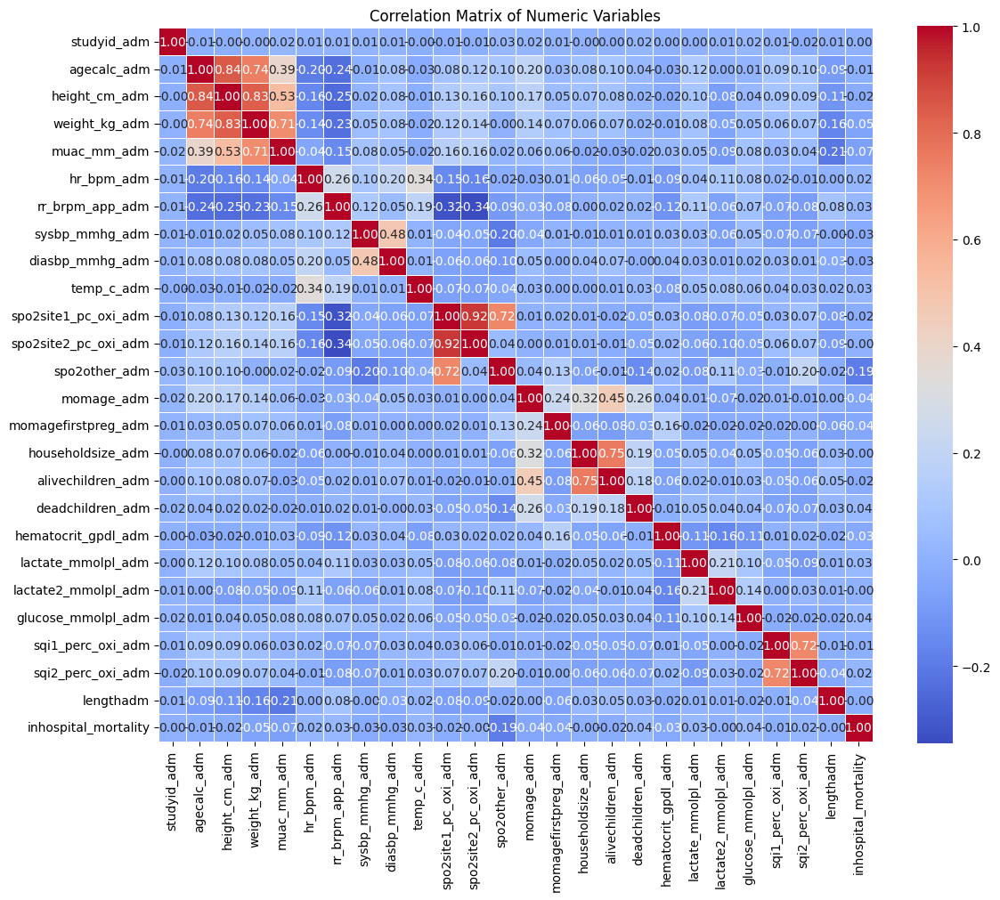

In [12]:
# Calculate correlation matrix for numeric columns
corr_matrix = df1[numeric_cols].corr()

# Plot correlation matrix as a heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True, linewidths=0.5)
plt.title("Correlation Matrix of Numeric Variables")
plt.tight_layout()
plt.show()


 🔍 *Interpretation of Top Correlations*

1. **`spo2site2_pc_oxi_adm` & `spo2site1_pc_oxi_adm` (0.92)**  
   These are likely redundant. Consider keeping only one unless there's a clinical reason to distinguish them.

2. **`height_cm_adm` & `agecalc_adm` (0.84)**  
   Unexpectedly high — double-check units and data quality. Normally, height stabilizes after adolescence.

3. **`height_cm_adm` & `weight_kg_adm` (0.83)**  
   Logical — taller individuals usually weigh more.

4. **`alivechildren_adm` & `householdsize_adm` (0.75)**  
   Makes sense — more children increase household size.

5. **`weight_kg_adm` & `agecalc_adm` (0.74)**  
   Suggests weight increases with age — but also review for confounding.

6. **`spo2other_adm` & `spo2site1_pc_oxi_adm` (0.72)**  
   High redundancy; might drop one in predictive models.

7. **`sqi2_perc_oxi_adm` & `sqi1_perc_oxi_adm` (0.72)**  
   Likely same measurement source quality index from two devices or sites.

8. **`muac_mm_adm` & `weight_kg_adm` (0.71)**  
   Mid-upper arm circumference reflects weight/nutrition — expected.

9. **`muac_mm_adm` & `height_cm_adm` (0.53)**  
   Also expected; taller individuals generally have larger limbs.

10. **`diasbp_mmhg_adm` & `sysbp_mmhg_adm` (0.48)**  
    Diastolic and systolic blood pressure are positively related.

---



In [13]:
# Outcome rate analysis (inhospital_mortality is the outcome variable)
outcome_rate = df1['inhospital_mortality'].value_counts(normalize=True) * 100
print("\nIn-hospital mortality rate:")
print(outcome_rate)





In-hospital mortality rate:
inhospital_mortality
0    95.56962
1     4.43038
Name: proportion, dtype: float64


The dataset contains a total of **2,686 pediatric patients** across **107 features** after initial cleaning and dropping irrelevant variables.

##### Mortality Distribution:
- **2,567 patients (95.6%) survived** during hospitalization.
- **119 patients (4.4%) died** during hospitalization.

This highlights a strong **class imbalance** where the majority of the patients survived. 
It suggests that modeling will require careful handling of imbalance, such as using balanced class weights or specialized evaluation metrics.


#### Summarize cohort 
Before proceeding with modeling, it is essential to summarize the characteristics of the patient cohort. 

This summary serves several important purposes:
- It helps understand the basic structure of the dataset, including the number of patients, features, and the distribution of outcomes.
- It provides an early opportunity to catch any major data quality issues (e.g., unexpected missingness or unbalanced outcomes).
- It establishes a baseline for later comparisons, ensuring that model predictions align with the real-world data distribution.
- It is a critical requirement for scientific reporting, where cohort summaries are typically included as standard practice.
- It acts as a sanity check, allowing us to build trust in the dataset before advancing to modeling and analysis.

Therefore, summarizing the cohort is a necessary and efficient step in preparing for robust and meaningful predictive modeling.


In [15]:
df1.groupby('inhospital_mortality')[top_features].describe().transpose()


inhospital_mortality                0           1
agecalc_adm        count  2567.000000  119.000000
                   mean     21.146747   20.619328
                   std      13.115328   11.773442
                   min       5.900000    5.900000
                   25%      10.500000   12.400000
                   50%      16.900000   18.400000
                   75%      28.600000   28.900000
                   max      61.800000   58.900000
glucose_mmolpl_adm count  2559.000000  118.000000
                   mean      6.299062    6.794068
                   std       2.462242    3.412328
                   min       0.000000    0.000000
                   25%       5.000000    5.100000
                   50%       6.000000    6.550000
                   75%       7.200000    7.800000
                   max      24.200000   21.800000
rr_brpm_app_adm    count  2562.000000  119.000000
                   mean     46.081577   48.294118
                   std      14.832028   15.617978
                   min      17.000000   19.000000
                   25%      35.000000   37.000000
                   50%      44.000000   49.000000
                   75%      56.000000   57.500000
                   max     116.000000  102.000000
hr_bpm_adm         count  2566.000000  119.000000
                   mean    141.106002  143.663866
                   std      25.470307   27.223581
                   min      42.000000   58.000000
                   25%     128.000000  128.000000
                   50%     143.000000  146.000000
                   75%     158.000000  163.000000
                   max     214.000000  192.000000

#### **Dealing with missing values**

In [16]:
# Check for missing values per column, sort, and show counts + percentages
missing_values = df1.isnull().sum()
missing_percent = (missing_values / len(df1)) * 100

missing_summary = pd.DataFrame({
    'Missing Values': missing_values,
    'Percentage': missing_percent
})

# Filter columns with missing values only
missing_summary = missing_summary[missing_summary['Missing Values'] > 0]

# Count number of columns with missing values
num_columns_with_missing = missing_summary.shape[0]
print(f"\nNumber of columns with missing values: {num_columns_with_missing}")

# Sort by number of missing values in descending order
missing_summary = missing_summary.sort_values(by='Missing Values', ascending=False)

print("\nMissing values per column (sorted):")
print(missing_summary)





Number of columns with missing values: 58

Missing values per column (sorted):
                          Missing Values  Percentage
nonexclbreastfed_adm                2603   96.909903
spo2other_adm                       2505   93.261355
lactate2_mmolpl_adm                 2217   82.539092
vaccmeaslessource_adm                946   35.219657
lactate_mmolpl_adm                   464   17.274758
hematocrit_gpdl_adm                  457   17.014147
momagefirstpreg_adm                  224    8.339538
sqi2_perc_oxi_adm                    207    7.706627
spo2site2_pc_oxi_adm                 205    7.632167
vaccpneumocsource_adm                185    6.887565
vaccdptsource_adm                    143    5.323902
sqi1_perc_oxi_adm                    130    4.839911
hctpretransfusion_adm                 43    1.600894
birthattend_adm                       30    1.116902
momageknown_adm                       22    0.819062
momage_adm                            19    0.707372
height_cm_adm      

### Analyze Missing Values
Identifying and understanding missing data is a critical step before building predictive models. 

This step serves several important purposes:
- **Maintaining dataset completeness:** Most machine learning algorithms cannot handle missing values directly. Knowing where missingness occurs allows us to plan appropriate imputation strategies.
- **Preventing bias:** Missing data can introduce biases if certain features or groups are systematically incomplete. Detecting patterns of missingness early helps mitigate this risk.
- **Prioritizing feature treatment:** Some features may have minor missingness and can be easily imputed, while others may have extensive missingness requiring careful handling or even removal.
- **Informing modeling decisions:** The amount and pattern of missing data can influence which algorithms and preprocessing techniques are appropriate.

Therefore, systematically analyzing missing values ensures we create a robust, fair, and high-performing predictive model.



- A total of **57 features** have missing values.
- The majority of features have **very low missingness** (1–6 missing entries), which is manageable with simple imputation.
- A few features have **substantial missingness**:
  - `lactate_mmolpl_adm` (~464 missing)
  - `hematocrit_gpdl_adm` (~457 missing)
  - `momagefirstpreg_adm` (~224 missing)
  - `sqi2_perc_oxi_adm`, `spo2site2_pc_oxi_adm`, `sqii_perc_oxi_adm` (all oxygen saturation quality indicators with 130–207 missing)

- Features like `hctpretransfusion_adm`, `birthattend_adm`, and `momageknown_adm` have moderate missingness (20–30 entries missing).
- **Critical clinical measures** (e.g., heart rate, respiratory rate, systolic/diastolic BP, temperature) have **very minimal missingness** (only 1–5 missing), indicating strong dataset reliability for vital signs.

#### Implication:
- **Simple imputation** (median for continuous, mode for categorical) will be sufficient for most features.
- Features with large missingness (>15%) will require careful attention during imputation, but do not necessarily need to be dropped due to their likely clinical significance.



In [17]:
drop_vars = [
    'spo2other_adm', 
    'lactate2_mmolpl_adm', 
    'nonexclbreastfed_adm',
    'vaccmeaslessource_adm'
]

# Filter only columns that exist in df1
existing_drop_vars = [col for col in drop_vars if col in df1.columns]

# Drop only existing columns
df1 = df1.drop(columns=existing_drop_vars)

# Confirm new shape
print("Shape after safe drop:", df1.shape)


Shape after safe drop: (2686, 114)


### Missing values imputation
After analyzing missing values, it is necessary to apply data imputation strategies to ensure dataset completeness for modeling. 

Handling missing values carefully is important because:
- Most machine learning models cannot accept missing data directly.
- Poor imputation can introduce bias or reduce model performance.
- Proper imputation maintains the clinical integrity of the features.

We categorize our imputation approach based on the level of missingness observed:

- **Highly Missing Features (more than 15% missing):**
  - Features like `lactate_mmolpl_adm` and `hematocrit_gpdl_adm`.
  - These will be imputed using the **median** for continuous variables to reduce the impact of extreme values, while preserving the central tendency of the feature.

- **Moderately Missing Features (5% to 15% missing):**
  - Features like `momagefirstpreg_adm`, `sqi2_perc_oxi_adm`, `spo2site2_pc_oxi_adm`.
  - These will also be imputed using **median** for continuous variables or **mode** for categorical variables based on feature type.

- **Negligibly Missing Features (less than 5% missing):**
  - The majority of features fall here.
  - These will be imputed using **simple median or mode imputation** depending on whether the variable is continuous or categorical.

This systematic imputation strategy ensures that the dataset remains statistically sound while minimizing potential biases introduced during data cleaning.


In [18]:
# Clinical hierarchy imputation
impute_order = [    
    'hr_bpm_adm',
    'muac_mm_adm'
]
for var in impute_order:
    df1[var] = df1.groupby('respdistress_adm')[var].transform(
        lambda x: x.fillna(x.median()))


# Special handling for meaningful missingness
df1['hivstatus_adm'] = df1['hivstatus_adm'].fillna('NotTested')
df1['bcseye_adm'] = df1['bcseye_adm'].fillna('Fails to watch or follow')

# Neurological worst-case imputation
df1['bcseye_adm'] = df1['bcseye_adm'].fillna('NoResponse')
df1['bcsverbal_adm'] = df1['bcsverbal_adm'].fillna('NoVocalResponse')

# Demographic handling
df1['momagefirstpreg_adm'] = df1['momagefirstpreg_adm'].fillna(-1)  
df1['hivstatus_adm'] = df1['hivstatus_adm'].fillna('NotTested')

# MUAC imputation based on weight for age
df1['muac_mm_adm'] = df1.groupby(pd.qcut(df1['weight_kg_adm'], 5), observed=True)['muac_mm_adm'].transform(
    lambda x: x.fillna(x.median()))

*logical imputation of hematocrit*

In [19]:
# Step 1: Define the age group bins
def assign_age_group(age_months):
    if age_months < 6:
        return '3-6 month'
    elif age_months < 12:
        return '6-1yr'
    elif age_months < 24:
        return '1-2yr'
    elif age_months < 36:
        return '2-3yr'
    elif age_months < 48:
        return '3-4yr'
    elif age_months < 60:
        return '4-5yr'
    elif age_months < 72:
        return '5-6yr'
    else:
        return 'older'

# Step 2: Create 'age_group' column
df1['age_group'] = df1['agecalc_adm'].apply(assign_age_group)

# Step 3: Group by age_group and sex_adm, then impute hematocrit
df1['hematocrit_gpdl_adm'] = df1.groupby(['age_group', 'sex_adm'])['hematocrit_gpdl_adm']\
    .transform(lambda x: x.fillna(x.median()))


*logical imputation of lactate*

In [20]:
# Step 1: Create shock index
df1['shockindex_heart_rate_sbp_adm'] = df1['hr_bpm_adm'] / df1['sysbp_mmhg_adm']

# Step 2: Create high-risk indicator based on SpO2 and shock index
df1['high_risk'] = ((df1['spo2site1_pc_oxi_adm'] < 90) | 
                          (df1['shockindex_heart_rate_sbp_adm'] > 1)).astype(int)

# Step 3: Impute lactate using median within risk groups (only one transform needed)
df1['lactate_mmolpl_adm'] = df1.groupby('high_risk')['lactate_mmolpl_adm']\
                                           .transform(lambda x: x.fillna(x.median()))

*logical imputation of spo2site1_pc_oxi_adm*

this is because the two columns are highly correlated


In [21]:
# Use spo2site2 to fill missing values in spo2site1
df1['spo2site1_pc_oxi_adm'] = df1['spo2site1_pc_oxi_adm'].fillna(
    df1['spo2site2_pc_oxi_adm']
)

# Use spo2site1 to fill missing values in spo2site2
df1['spo2site2_pc_oxi_adm'] = df1['spo2site2_pc_oxi_adm'].fillna(
    df1['spo2site1_pc_oxi_adm']
)

*logical imputation of spo2site2_pc_oxi_adm*

this was in cases where both measurements were missing, grouping by age then calculating the median


In [22]:
# Create age group
df1['age_group2'] = df1['agecalc_adm'].apply(lambda x: '<1yr' if x < 1 else '≥1yr')

# Impute SpO2 site 1
df1['spo2site1_pc_oxi_adm'] = df1.groupby('age_group2')['spo2site1_pc_oxi_adm']\
                                             .transform(lambda x: x.fillna(x.median()))

# Impute SpO2 site 2
df1['spo2site2_pc_oxi_adm'] = df1.groupby('age_group2')['spo2site2_pc_oxi_adm']\
                                             .transform(lambda x: x.fillna(x.median()))

*logical imputation of sqi1_perc_oxi_adm and sqi2_perc_oxi_adm*

In [23]:
# Step 1: Use cross-SQI imputation
df1['sqi1_perc_oxi_adm'] = df1['sqi1_perc_oxi_adm'].fillna(df1['sqi2_perc_oxi_adm'])
df1['sqi2_perc_oxi_adm'] = df1['sqi2_perc_oxi_adm'].fillna(df1['sqi1_perc_oxi_adm'])
df1['sqi1_perc_oxi_adm'] = df1['sqi1_perc_oxi_adm'].fillna(df1['sqi1_perc_oxi_adm'].median())
df1['sqi2_perc_oxi_adm'] = df1['sqi2_perc_oxi_adm'].fillna(df1['sqi2_perc_oxi_adm'].median())

In [24]:
# Check for missing values per column, sort, and show counts + percentages
missing_values = df1.isnull().sum()
missing_percent = (missing_values / len(df1)) * 100

missing_summary = pd.DataFrame({
    'Missing Values': missing_values,
    'Percentage': missing_percent
})

# Filter columns with missing values only
missing_summary = missing_summary[missing_summary['Missing Values'] > 0]

# Count number of columns with missing values
num_columns_with_missing = missing_summary.shape[0]
print(f"\nNumber of columns with missing values: {num_columns_with_missing}")

# Sort by number of missing values in descending order
missing_summary = missing_summary.sort_values(by='Missing Values', ascending=False)

print("\nMissing values per column (sorted):")
print(missing_summary)


Number of columns with missing values: 44

Missing values per column (sorted):
                               Missing Values  Percentage
vaccpneumocsource_adm                     185    6.887565
vaccdptsource_adm                         143    5.323902
hctpretransfusion_adm                      43    1.600894
birthattend_adm                            30    1.116902
momageknown_adm                            22    0.819062
momage_adm                                 19    0.707372
height_cm_adm                              14    0.521221
glucose_mmolpl_adm                          9    0.335071
muac_mm_adm                                 9    0.335071
weight_kg_adm                               9    0.335071
momhiv_adm                                  6    0.223380
rr_brpm_app_adm                             5    0.186150
priorhosp_adm                               5    0.186150
badhealthduration_adm                       4    0.148920
shockindex_heart_rate_sbp_adm               4    0

In [25]:
# Step 1: Get columns that have at least one missing value
cols_with_missing = df1.columns[df1.isnull().any()].tolist()

# Step 2: Create a new DataFrame with only those columns
df1_missing_subset = df1[cols_with_missing]

In [26]:
# Step 1: Select numeric columns only
numeric_cols = df1_missing_subset.select_dtypes(include='number')

# Step 2: Calculate skewness for each numeric column
skewness = numeric_cols.skew()

# Step 3: Filter columns where skewness is between -0.5 and +0.5
symmetric_cols = skewness[(skewness > -0.5) & (skewness < 0.5)].index.tolist()

print("Columns with fairly symmetric distributions:", symmetric_cols)

Columns with fairly symmetric distributions: ['muac_mm_adm', 'sysbp_mmhg_adm', 'diasbp_mmhg_adm', 'shockindex_heart_rate_sbp_adm']


In [27]:
# Columns you want to fill using the mean
mean_fill_cols = ['muac_mm_adm', 'sysbp_mmhg_adm', 'diasbp_mmhg_adm', 'shockindex_heart_rate_sbp_adm']  # Replace with your column names

# Step 1: Fill specified columns with mean
for col in mean_fill_cols:
    if col in df1.columns and pd.api.types.is_numeric_dtype(df1[col]):
        df1[col] = df1[col].fillna(df1[col].mean())

# Step 2: Fill remaining numeric columns (excluding mean_fill_cols) that still have NaNs with median
remaining_cols = df1.select_dtypes(include='number').columns.difference(mean_fill_cols)
for col in remaining_cols:
    if df1[col].isna().any():
        df1[col] = df1[col].fillna(df1[col].median())


In [28]:
# First, calculate mode (most frequent value)
mode_value = df1['hctpretransfusion_adm'].mode()[0]

# Define custom function
def impute_hctpretransfusion(row):
    if pd.isna(row['hctpretransfusion_adm']):
        if row['hematocrit_gpdl_adm'] < 10 or row['hematocrit_gpdl_adm'] > 50:
            return 'Yes'
        else:
            return mode_value
    else:
        return row['hctpretransfusion_adm']

# Apply the function to fill missing values
df1['hctpretransfusion_adm'] = df1.apply(impute_hctpretransfusion, axis=1)

#Fill any non-numeric columns with mode
non_numeric_cols = df1.select_dtypes(exclude='number').columns
for col in non_numeric_cols:
    if df1[col].isna().any():
        mode = df1[col].mode()
        if not mode.empty:
            df1[col] = df1[col].fillna(mode[0])

In [29]:
# Check for missing values 
print(df1.isnull().sum(). sum())


0


#### What our imputation code does: 

| Step | Action |
|:---|:---|
| **1** | Separates continuous (numeric) features and categorical features. |
| **2** | Creates two imputers: median imputer for continuous features and mode imputer for categorical features. |
| **3** | Applies the median imputer to continuous features and the mode imputer to categorical features. |
| **4** | Confirms that all missing values have been handled by printing the total number of missing entries remaining. |

We have successfully done our imputation as evidenced by the 0 missing values output. 

#### Why We Chose Median and Mode for Imputation

We chose **Median Imputation** for continuous variables and **Mode Imputation** for categorical variables, instead of using advanced methods like KNN, MICE, or XGBoost.

**Reasons for this choice:**
- **Simplicity and Speed:** Median and mode imputation are fast to apply and easy to interpret, making them suitable for our initial data cleaning stage.
- **Robustness to Outliers:** Median is less sensitive to extreme values, which is important given the presence of outliers in clinical data.
- **Low Risk of Overfitting:** Advanced imputation methods like KNN, MICE, and model-based imputations (e.g., XGBoost) can introduce unnecessary complexity or bias if not carefully tuned.
- **Focus on Early Modeling:** At this stage, our goal is to prepare a clean and usable dataset quickly for baseline model development. More sophisticated methods can be explored later if necessary.

**Why We Handled Continuous and Categorical Variables Separately:**
- **Different Data Types:** Continuous features are numerical and need statistical imputation like median, while categorical features represent labels and require mode or classification-based imputation.
- **Preserve Data Integrity:** Treating categories as numbers would distort the meaning of the data, and treating numbers as categories would lose important variance.
- **Best Practice:** Handling continuous and categorical features separately ensures more accurate, meaningful imputations and supports better model performance later.

By using median and mode, and treating feature types separately, we ensured a practical, reliable, and efficient imputation approach that maintains the clinical and statistical integrity of the dataset while supporting rapid progress toward predictive modeling.




#### **EDA PART TWO**

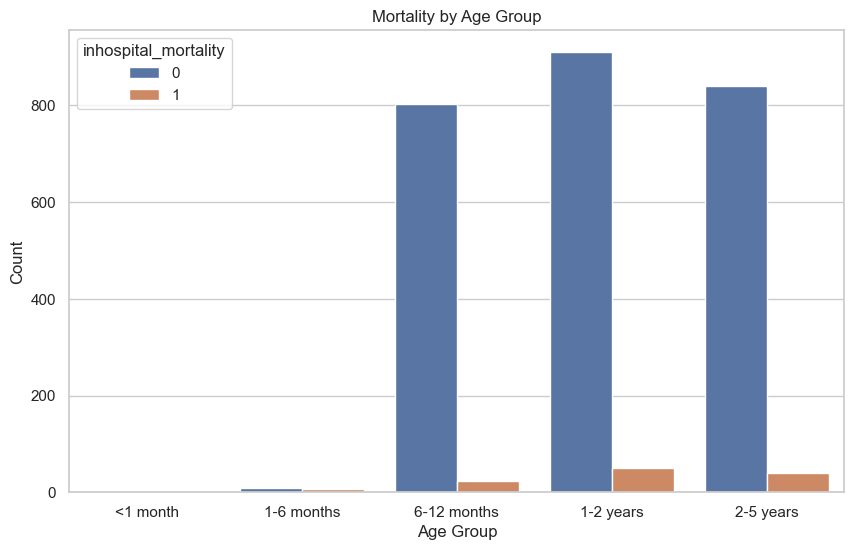


Mortality by age group:
             total_patients  deaths  mortality_rate
age_group                                          
<1 month                  0       0             NaN
1-6 months               14       6       42.857143
6-12 months             827      23        2.781137
1-2 years               961      51        5.306972
2-5 years               879      39        4.436860


C:\Users\820 g4\AppData\Local\Temp\ipykernel_8488\2740234389.py:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  age_mortality = df1.groupby('age_group')['inhospital_mortality'].agg(['count', 'sum', 'mean'])


In [89]:
# Set style
sns.set(style="whitegrid")
plt.rcParams["figure.figsize"] = (10, 6)

# Optional: Rename mortality labels for readability
df1['mortality_label'] = df1['inhospital_mortality'].map({0: 'Alive', 1: 'Death'})

# 1. Age distribution (months)
bins = [0, 1, 6, 12, 24, 60]  # months
labels = ['<1 month', '1-6 months', '6-12 months', '1-2 years', '2-5 years']
df1['age_group'] = pd.cut(df1['agecalc_adm'], bins=bins, labels=labels)

# Mortality by age group
plt.figure(figsize=(10, 6))
sns.countplot(x='age_group', hue='inhospital_mortality', data=df1)
plt.title('Mortality by Age Group')
plt.xlabel('Age Group')
plt.ylabel('Count')
plt.show()

# Calculate mortality rates by age group
age_mortality = df1.groupby('age_group')['inhospital_mortality'].agg(['count', 'sum', 'mean'])
age_mortality['mortality_rate'] = age_mortality['mean'] * 100
age_mortality = age_mortality.rename(columns={'count': 'total_patients', 'sum': 'deaths'})
print("\nMortality by age group:")
print(age_mortality[['total_patients', 'deaths', 'mortality_rate']])


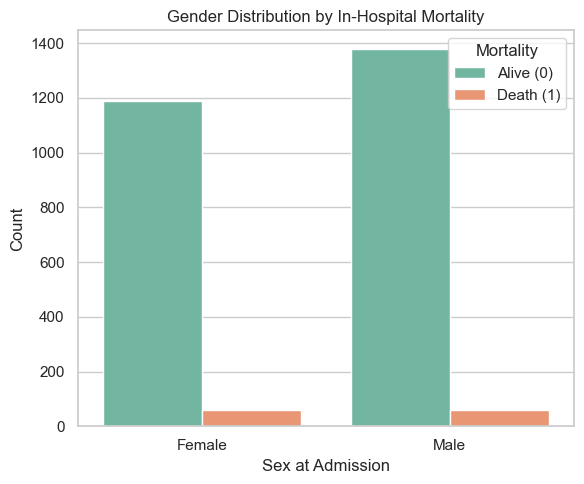

In [90]:
# 2. Gender distribution

# Set plot style
sns.set(style="whitegrid")

# Create the bar plot
plt.figure(figsize=(6, 5))
sns.countplot(data=df1, x='sex_adm', hue='inhospital_mortality', palette='Set2')

# Customize labels
plt.title("Gender Distribution by In-Hospital Mortality")
plt.xlabel("Sex at Admission")
plt.ylabel("Count")
plt.legend(title="Mortality", labels=["Alive (0)", "Death (1)"])
plt.tight_layout()
plt.show()



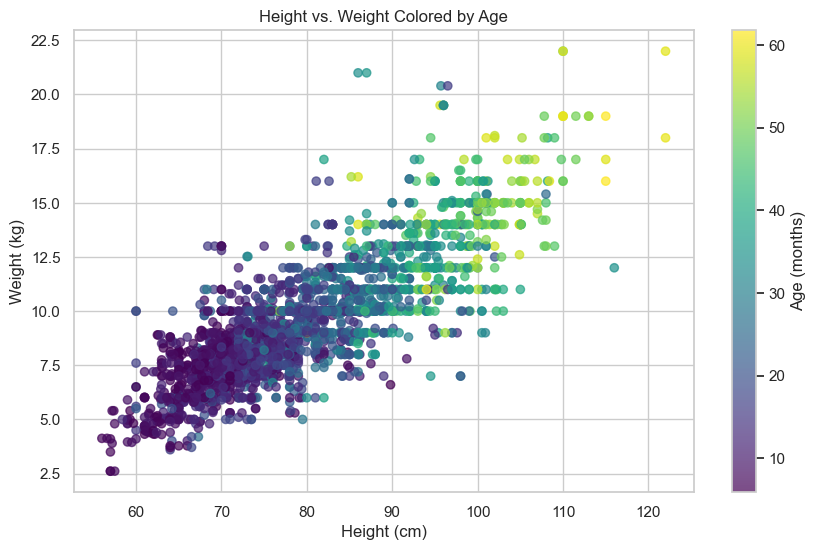

In [91]:
# 3. Height vs Weight, colored by Age
scatter = plt.scatter(
    df1['height_cm_adm'],
    df1['weight_kg_adm'],
    c=df1['agecalc_adm'],
    cmap='viridis',
    alpha=0.7
)
plt.colorbar(scatter, label='Age (months)')
plt.title('Height vs. Weight Colored by Age')
plt.xlabel('Height (cm)')
plt.ylabel('Weight (kg)')
plt.show()


C:\Users\820 g4\AppData\Local\Temp\ipykernel_8488\2344305587.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='age_group', y='muac_mm_adm', data=df1, palette='coolwarm')


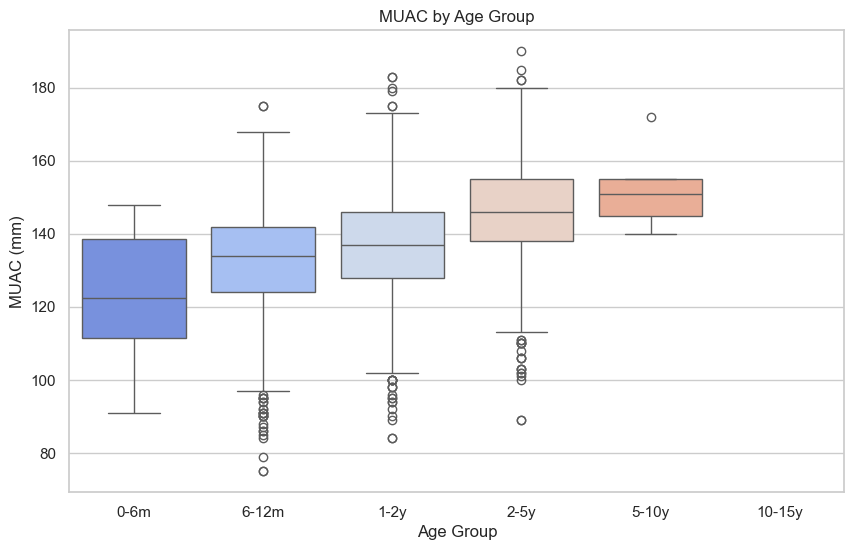

In [ ]:

# 4. MUAC by age group
df1['age_group'] = pd.cut(df1['agecalc_adm'], bins=[0, 6, 12, 24, 60, 120, 180], 
                         labels=['0-6m', '6-12m', '1-2y', '2-5y', '5-10y', '10-15y'])
sns.boxplot(x='age_group', y='muac_mm_adm', data=df1, palette='coolwarm')
plt.title('MUAC by Age Group')
plt.xlabel('Age Group')
plt.ylabel('MUAC (mm)')
plt.show()



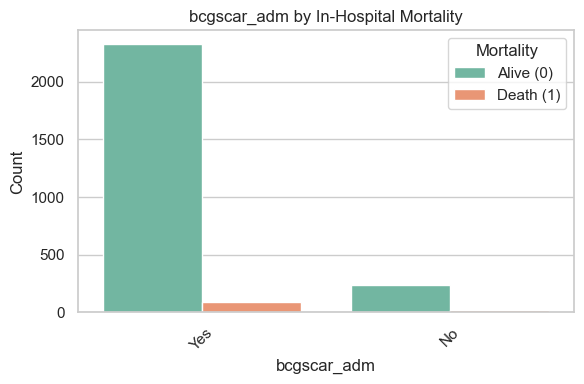

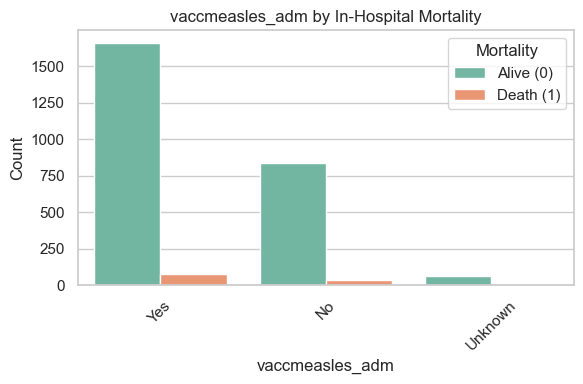

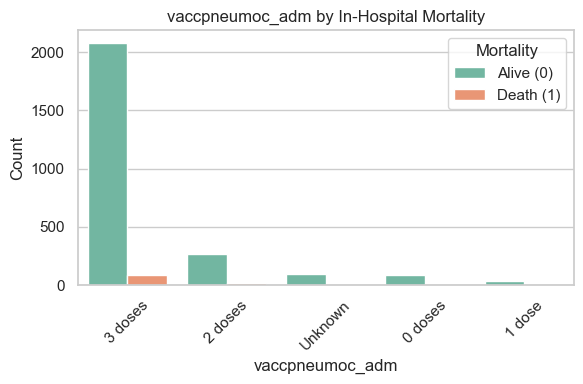

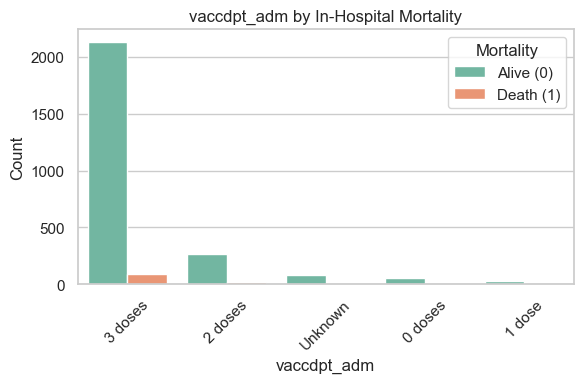

In [94]:
# 5. Vaccination status bar plots
# List of vaccination columns
vaccine_cols = ['bcgscar_adm', 'vaccmeasles_adm', 'vaccpneumoc_adm', 'vaccdpt_adm']

# Set plot style
sns.set(style="whitegrid")

# Loop through each vaccination column and plot
for col in vaccine_cols:
    plt.figure(figsize=(6, 4))
    sns.countplot(data=df1, x=col, hue='inhospital_mortality', palette='Set2')
    plt.title(f'{col} by In-Hospital Mortality')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.legend(title='Mortality', labels=['Alive (0)', 'Death (1)'])
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()



Exploratory Data Analysis (EDA) Plan for Sepsis Data
Based on the data dictionary you've provided, here's a comprehensive EDA plan after dropping antibiotic variables and imputing missing data:

1. Demographic Analysis
Age distribution: Histogram/KDE plot of agecalc_adm (in months)

Gender distribution: Bar plot of sex_adm

Anthropometrics:

Scatter plot of height_cm_adm vs weight_kg_adm with age as color

Boxplots of muac_mm_adm by age groups

Vaccination status: Bar plots for bcgscar_adm, vaccmeasles_adm, vaccpneumoc_adm, vaccdpt_adm

2. Clinical Vital Signs Analysis
Vital signs distributions:

Histograms for hr_bpm_adm, rr_brpm_app_adm, sysbp_mmhg_adm, diasp_mmhg_adm, temp_c_adm

Correlation heatmap between vital signs

Oxygen status:

Distribution of spo2site1_pc_oxi_adm and comparison with spo2onoxy_adm

Boxplot of SpO2 by respidistress_adm

Neurological assessment:

Stacked bar plots for bcseye_adm, bcsmotor_adm, bcsverbal_adm

3. Symptoms and Comorbidities Analysis
Symptom prevalence:

Bar plot of top symptoms (from symptoms_adm_1 to symptoms_adm_18)

Heatmap of symptom co-occurrence

Comorbidity analysis:

Prevalence of comorbidities (from comorbidity_adm_1 to comorbidity_adm_12)

Comorbidity networks or association rules

4. Laboratory Results Analysis
Distributions:

Histograms for hematocrit_gpdl_adm, lactate_mmolpl_adm, glucose_mmolpl_adm

Abnormal values:

Flag abnormal lab values and analyze their association with outcomes

Malaria and HIV:

Prevalence of malariastatuspos_adm and hivstatus_adm

Association with other clinical variables

5. Social and Environmental Factors
Household characteristics:

Distribution of householdsize_adm, watersource_adm, waterpure_adm

Cooking fuel usage patterns (from cookfuel_adm_1 to cookfuel_adm_8)

Caregiver analysis:

caregiver_adm_new distribution

momedu_adm levels and association with outcomes

Travel and access:

travelmethod_adm and traveldist_adm distributions

6. Outcome Analysis
Mortality analysis:

Prevalence of in_hospital_mortality

Comparison of vital signs, lab values between survivors and non-survivors

ROC analysis for predictors of mortality

Length of stay:

Distribution of lengthadm

Relationship between length of stay and severity indicators

7. Temporal and Progression Analysis
Lactate trends: Compare lactate_mmolpl_adm and lactate2_mmolpl_adm

Symptom duration: Analyze badhealthduration_adm in relation to outcomes

In [5]:
print(df1.columns)

Index(['studyid_adm', 'agecalc_adm', 'height_cm_adm', 'weight_kg_adm',
       'muac_mm_adm', 'hr_bpm_adm', 'rr_brpm_app_adm', 'sysbp_mmhg_adm',
       'diasbp_mmhg_adm', 'temp_c_adm',
       ...
       'cookloc_adm', 'lightfuel_adm', 'tobacco_adm', 'bednet_adm',
       'hctpretransfusion_adm', 'hivstatus_adm', 'malariastatuspos_adm',
       'lengthadm', 'caregiver_adm_new', 'inhospital_mortality'],
      dtype='object', length=138)



Prevalence of malariastatuspos_adm:
malariastatuspos_adm
No     68.777943
Yes    31.222057
Name: proportion, dtype: float64

Prevalence of hivstatus_adm:
hivstatus_adm
HIV negative    97.016039
HIV positive     2.983961
Name: proportion, dtype: float64

--- Association with Malaria Status ---
hr_bpm_adm: U=801421.50, p=0.1203


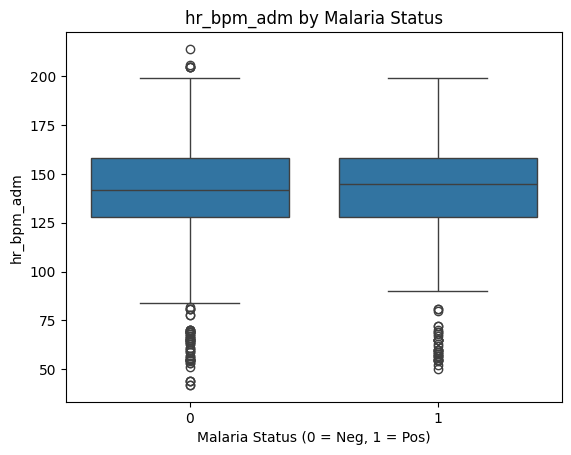

rr_brpm_app_adm: U=771644.50, p=0.9454


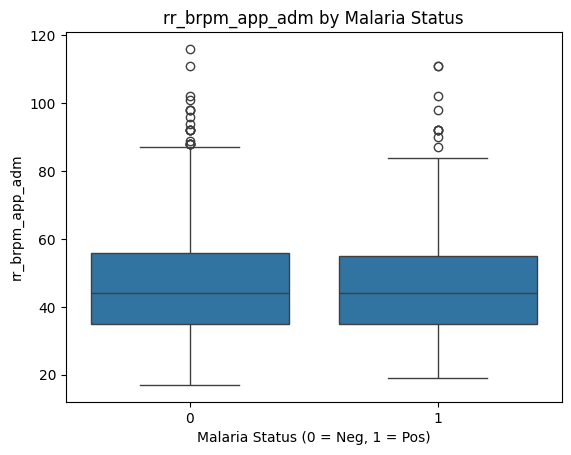

sysbp_mmhg_adm: U=761755.00, p=0.5764


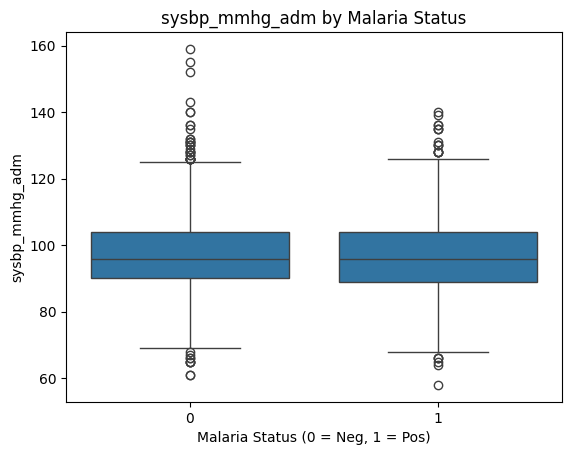

diasbp_mmhg_adm: U=730299.00, p=0.0230


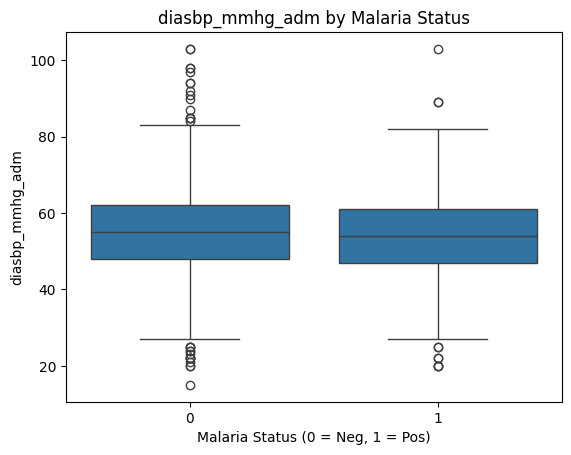

temp_c_adm: U=829424.50, p=0.0022


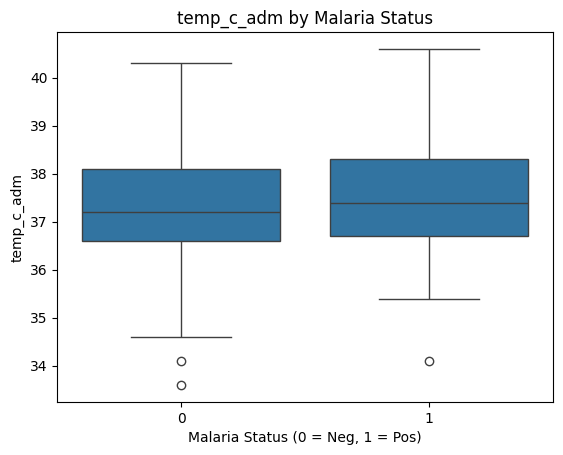


--- Association with HIV Status ---
hr_bpm_adm: U=98620.50, p=0.4299


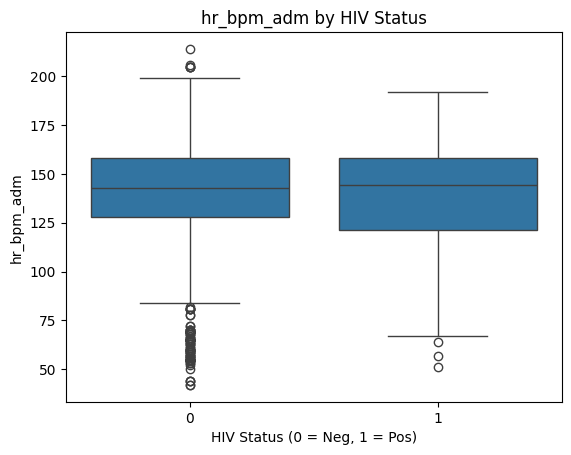

rr_brpm_app_adm: U=117455.50, p=0.0454


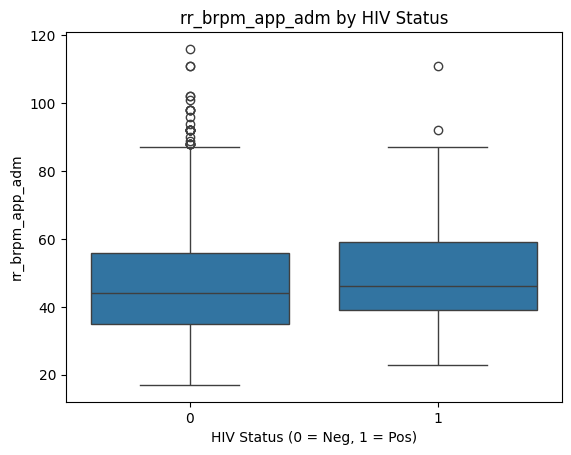

sysbp_mmhg_adm: U=112190.50, p=0.2270


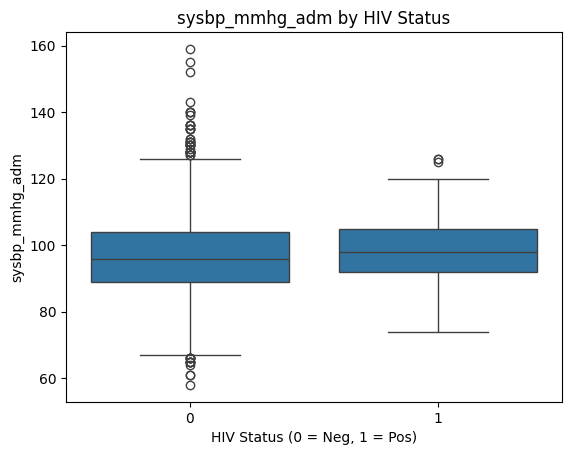

diasbp_mmhg_adm: U=96274.00, p=0.2569


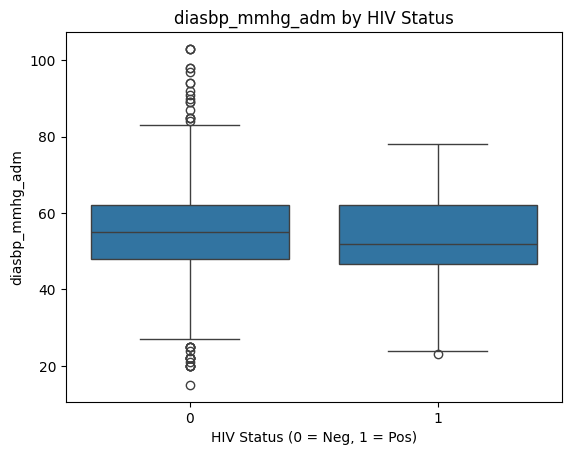

temp_c_adm: U=99998.00, p=0.5569


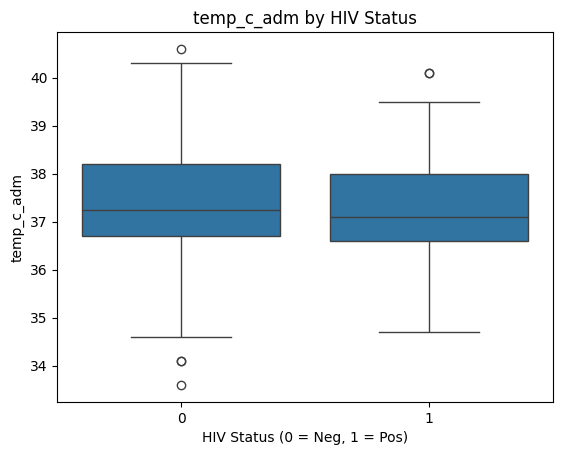

In [9]:
#Number 5
from scipy.stats import mannwhitneyu

# Clinical variables to analyze
clinical_vars = [
    "hr_bpm_adm",
    "rr_brpm_app_adm",
    "sysbp_mmhg_adm",
    "diasbp_mmhg_adm",
    "temp_c_adm"
]

# Function to calculate prevalence
def print_prevalence(df1, col):
    prevalence = df1[col].value_counts(normalize=True) * 100
    print(f"\nPrevalence of {col}:")
    print(prevalence)

# Function to visualize and test associations
def analyze_association(df1, status_var, label):
    print(f"\n--- Association with {label} ---")

    # Map to binary values
    if status_var == 'malariastatuspos_adm':
        df1 = df1[df1[status_var].isin(['Yes', 'No'])].copy()
        df1['status_binary'] = df1[status_var].map({'No': 0, 'Yes': 1})
    elif status_var == 'hivstatus_adm':
        df1 = df1[df1[status_var].isin(['HIV negative', 'HIV positive'])].copy()
        df1['status_binary'] = df1[status_var].map({'HIV negative': 0, 'HIV positive': 1})
    else:
        return

    for var in clinical_vars:
        group1 = df1[df1['status_binary'] == 1][var].dropna()
        group0 = df1[df1['status_binary'] == 0][var].dropna()

        if len(group1) > 0 and len(group0) > 0:
            stat, p = mannwhitneyu(group1, group0, alternative='two-sided')
            print(f"{var}: U={stat:.2f}, p={p:.4f}")

            sns.boxplot(x='status_binary', y=var, data=df1)
            plt.title(f"{var} by {label}")
            plt.xlabel(label + " (0 = Neg, 1 = Pos)")
            plt.ylabel(var)
            plt.show()


# Prevalence
print_prevalence(df1, 'malariastatuspos_adm')
print_prevalence(df1, 'hivstatus_adm')

# Associations
analyze_association(df1, 'malariastatuspos_adm', 'Malaria Status')
analyze_association(df1, 'hivstatus_adm', 'HIV Status')


#### Association Between Malaria Status and Blood Pressure

##### Diastolic Blood Pressure (diasbp_mmhg_adm)

A comparison of diastolic blood pressure between malaria-positive and malaria-negative groups reveals a statistically significant difference:

- **Mann-Whitney U Test**: U = 730,299.00, p = 0.0230

This p-value (< 0.05) indicates that the difference in distributions is unlikely due to random chance.

Additionally, the boxplot visualization shows that:
- The **malaria-negative group** has **more outliers**, indicating a wider spread and more extreme high values of diastolic blood pressure.
- The **malaria-positive group** shows a more compact distribution with fewer extreme values.

These findings suggest that **malaria status is associated with variations in diastolic blood pressure**, with malaria-positive patients exhibiting less variability and fewer high outliers.

##### Systolic vs Diastolic Blood Pressure

- **Systolic Blood Pressure** (e.g., `sysbp_mmhg_adm`) is the pressure in the arteries when the heart contracts.
- **Diastolic Blood Pressure** (`diasbp_mmhg_adm`) is the pressure in the arteries when the heart is at rest between beats.

Both metrics are crucial indicators of cardiovascular function, and changes in either can reflect stress or pathology. In this analysis, **diastolic pressure showed a significant association with malaria status**, whereas systolic pressure did not (based on p-value).


#### *hypothesis tests*

In [30]:
# 1. Separate categorical and continuous features
target = 'inhospital_mortality'
categorical_features = df1.select_dtypes(include=['object', 'category', 'bool']).columns.tolist()
continuous_features = df1.select_dtypes(include=['int64', 'float64']).drop(columns=[target]).columns.tolist()

significant_cat = []
significant_cont = []

# 2. Chi-Square test for categorical features
for col in categorical_features:
    contingency = pd.crosstab(df1[col], df1[target])
    if contingency.shape[0] > 1 and contingency.shape[1] > 1:
        try:
            chi2, p, _, _ = stats.chi2_contingency(contingency)
            if p < 0.01:
                significant_cat.append(col)
        except Exception as e:
            print(f"Chi-square failed for {col}: {e}")

# 3. Mann-Whitney U Test for continuous features
for col in continuous_features:
    group0 = df1[df1[target] == 0][col]
    group1 = df1[df1[target] == 1][col]
    if group0.notna().sum() > 0 and group1.notna().sum() > 0:
        try:
            u_stat, p_value = stats.mannwhitneyu(group0, group1, alternative='two-sided', nan_policy='omit')
            if p_value < 0.01:
                significant_cont.append(col)
        except Exception as e:
            print(f"Mann-Whitney U test failed for {col}: {e}")

# 4. Combine and review
significant_features = significant_cat + significant_cont
print(f"Total significant features (p < 0.01): {len(significant_features)}")
print(significant_features)


Total significant features (p < 0.01): 19
['spo2onoxy_adm', 'oxygenavail_adm', 'respdistress_adm', 'caprefill_adm', 'bcseye_adm', 'bcsmotor_adm', 'bcsverbal_adm', 'bcgscar_adm', 'symptoms_adm___14', 'symptoms_adm___15', 'diarrheaoften_adm', 'feedingstatus_adm', 'totalbreastfed_adm', 'caregivermarried_adm', 'waterpure_adm', 'bednet_adm', 'hctpretransfusion_adm', 'weight_kg_adm', 'lactate_mmolpl_adm']


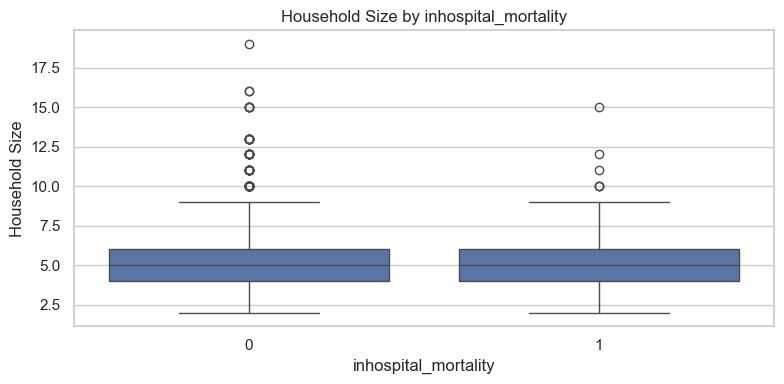

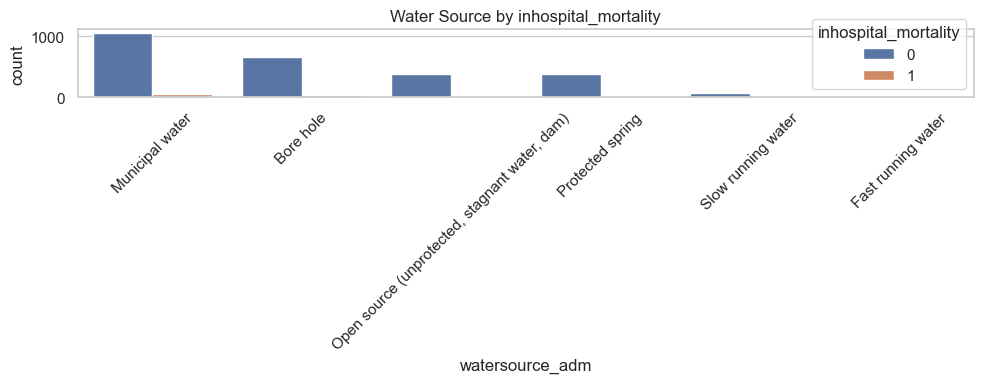

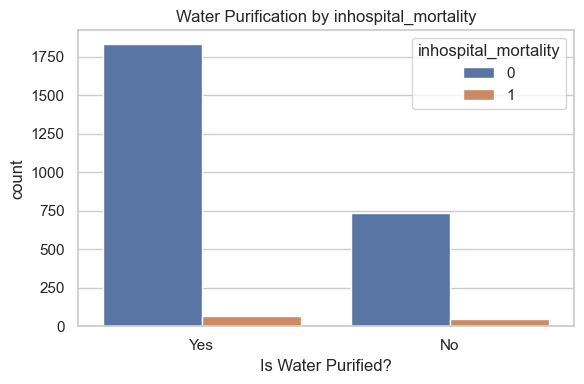

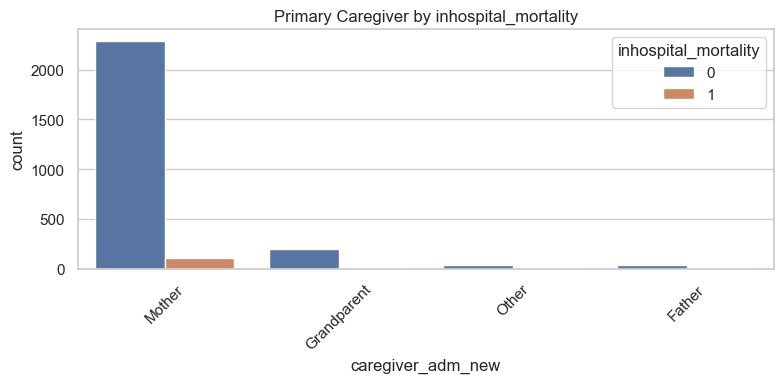

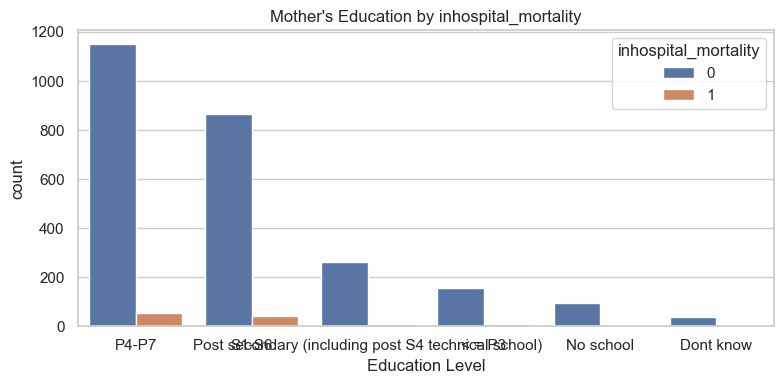

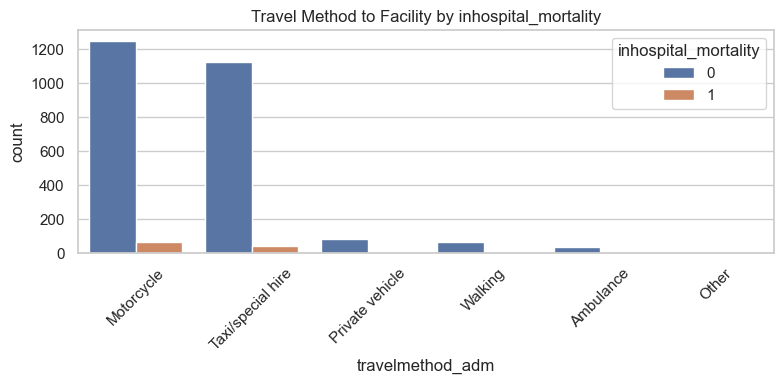

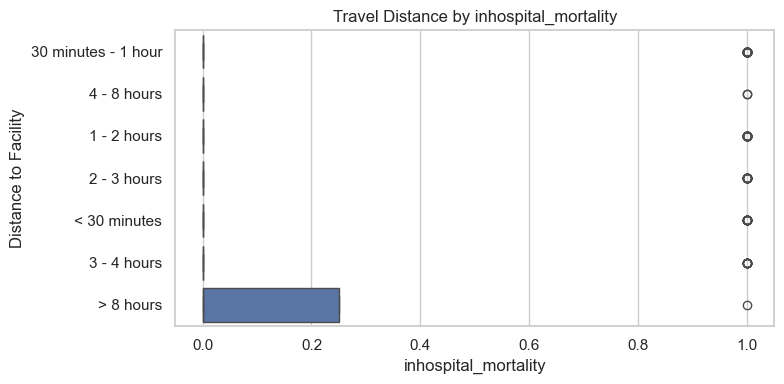

In [17]:
# Social and Environmental Factors Analysis with inhospital_mortality Comparison
# Set plot style
sns.set(style="whitegrid")

# Load data (assumes df1 is already loaded and cleaned)

# === Household Characteristics ===

## 1. Household size distribution by inhospital_mortality
plt.figure(figsize=(8, 4))
sns.boxplot(x='inhospital_mortality', y='householdsize_adm', data=df1)
plt.title("Household Size by inhospital_mortality")
plt.xlabel("inhospital_mortality")
plt.ylabel("Household Size")
plt.tight_layout()
plt.show()

## 2. Water source and purification by inhospital_mortality
plt.figure(figsize=(10, 4))
sns.countplot(x='watersource_adm', hue='inhospital_mortality', data=df1, order=df1['watersource_adm'].value_counts().index)
plt.title("Water Source by inhospital_mortality")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

plt.figure(figsize=(6, 4))
sns.countplot(x='waterpure_adm', hue='inhospital_mortality', data=df1)
plt.title("Water Purification by inhospital_mortality")
plt.xlabel("Is Water Purified?")
plt.tight_layout()
plt.show()

# === Caregiver Analysis ===

## 1. Caregiver type by inhospital_mortality
plt.figure(figsize=(8, 4))
sns.countplot(x='caregiver_adm_new', hue='inhospital_mortality', data=df1, order=df1['caregiver_adm_new'].value_counts().index)
plt.title("Primary Caregiver by inhospital_mortality")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## 2. Mother's education by inhospital_mortality
plt.figure(figsize=(8, 4))
sns.countplot(x='momedu_adm', hue='inhospital_mortality', data=df1, order=df1['momedu_adm'].value_counts().index)
plt.title("Mother's Education by inhospital_mortality")
plt.xlabel("Education Level")
plt.tight_layout()
plt.show()

# === Travel and Access ===

## 1. Travel method to facility by inhospital_mortality
plt.figure(figsize=(8, 4))
sns.countplot(x='travelmethod_adm', hue='inhospital_mortality', data=df1, order=df1['travelmethod_adm'].value_counts().index)
plt.title("Travel Method to Facility by inhospital_mortality")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## 2. Travel distance distribution by inhospital_mortality
plt.figure(figsize=(8, 4))
sns.boxplot(x='inhospital_mortality', y='traveldist_adm', data=df1)
plt.title("Travel Distance by inhospital_mortality")
plt.xlabel("inhospital_mortality")
plt.ylabel("Distance to Facility")
plt.tight_layout()
plt.show()


#### **Creating a copy of the original dataset before encoding**

In [31]:
df2=df1.copy()

In [32]:
df2 = df2.drop(columns=['studyid_adm', 'age_group2'])


*encoding categorical features*

In [33]:
# Identify categorical columns
categorical_cols = df2.select_dtypes(include='object').columns

# Count unique values in each categorical column
cat_unique_counts = df2[categorical_cols].nunique().sort_values()

# Create a summary DataFrame
cat_summary = pd.DataFrame({
    'Categorical Variable': cat_unique_counts.index,
    'Unique Values Count': cat_unique_counts.values
})

# Display all rows
pd.set_option('display.max_rows', None)

# Print the full summary
print(cat_summary)

        Categorical Variable  Unique Values Count
0        comorbidity_adm___4                    1
1          symptoms_adm___18                    1
2                    sex_adm                    2
3              spo2onoxy_adm                    2
4                 bcseye_adm                    2
5          vaccdptsource_adm                    2
6           respdistress_adm                    2
7              caprefill_adm                    2
8           symptoms_adm___8                    2
9           symptoms_adm___7                    2
10          symptoms_adm___6                    2
11          symptoms_adm___5                    2
12          symptoms_adm___4                    2
13          symptoms_adm___3                    2
14     vaccpneumocsource_adm                    2
15               bcgscar_adm                    2
16          symptoms_adm___9                    2
17         symptoms_adm___10                    2
18         symptoms_adm___11                    2


In [34]:
# Full list of categorical variables
categorical_vars = [
    'sex_adm', 'spo2onoxy_adm', 'oxygenavail_adm', 'respdistress_adm', 'caprefill_adm',
    'bcseye_adm', 'bcsmotor_adm', 'bcsverbal_adm', 'bcgscar_adm', 'vaccmeasles_adm',
    'vaccpneumoc_adm', 'vaccpneumocsource_adm', 'vaccdpt_adm', 'vaccdptsource_adm',
    'priorweekabx_adm', 'priorweekantimal_adm', 'symptoms_adm___1', 'symptoms_adm___2',
    'symptoms_adm___3', 'symptoms_adm___4', 'symptoms_adm___5', 'symptoms_adm___6',
    'symptoms_adm___7', 'symptoms_adm___8', 'symptoms_adm___9', 'symptoms_adm___10',
    'symptoms_adm___11', 'symptoms_adm___12', 'symptoms_adm___13', 'symptoms_adm___14',
    'symptoms_adm___15', 'symptoms_adm___16', 'symptoms_adm___18', 'comorbidity_adm___1',
    'comorbidity_adm___2', 'comorbidity_adm___3', 'comorbidity_adm___4', 'comorbidity_adm___5',
    'comorbidity_adm___6', 'comorbidity_adm___7', 'comorbidity_adm___8', 'comorbidity_adm___9',
    'comorbidity_adm___10', 'comorbidity_adm___11', 'comorbidity_adm___12', 'priorhosp_adm',
    'prioryearwheeze_adm', 'prioryearcough_adm', 'diarrheaoften_adm', 'tbcontact_adm',
    'feedingstatus_adm', 'exclbreastfed_adm', 'totalbreastfed_adm', 'deliveryloc_adm',
    'birthattend_adm', 'duedateknown_adm', 'birthdetail_adm___1', 'birthdetail_adm___2',
    'birthdetail_adm___3', 'birthdetail_adm___4', 'birthdetail_adm___5', 'birthdetail_adm___6',
    'travelmethod_adm', 'traveldist_adm', 'badhealthduration_adm', 'caregiverage_adm',
    'caregivermarried_adm', 'momalive_adm', 'momageknown_adm', 'momagefirstpregknown_adm',
    'momedu_adm', 'momhiv_adm', 'watersource_adm', 'waterpure_adm', 'cookfuel_adm___1',
    'cookfuel_adm___2', 'cookfuel_adm___3', 'cookfuel_adm___4', 'cookfuel_adm___5',
    'cookfuel_adm___6', 'cookfuel_adm___7', 'cookloc_adm', 'lightfuel_adm', 'tobacco_adm',
    'bednet_adm', 'hctpretransfusion_adm', 'hivstatus_adm', 'malariastatuspos_adm',
    'caregiver_adm_new'
]

# Subset marked as ordinal
ordinal_cat = [
    'watersource_adm', 'vaccpneumoc_adm', 'vaccdpt_adm', 'tobacco_adm', 'traveldist_adm',
    'feedingstatus_adm', 'deliveryloc_adm', 'birthattend_adm', 'bcseye_adm', 'bcsmotor_adm',
    'exclbreastfed_adm', 'oxygenavail_adm', 'bcsverbal_adm', 'priorhosp_adm',
    'totalbreastfed_adm', 'bednet_adm', 'badhealthduration_adm', 'caregiverage_adm',
    'momedu_adm'
]

# Derive nominal by subtracting ordinal from total list
nominal_cat = [col for col in categorical_vars if col not in ordinal_cat]

# Display
print("Ordinal categorical variables:\n", ordinal_cat)
print("\nNominal categorical variables:\n", nominal_cat)


Ordinal categorical variables:
 ['watersource_adm', 'vaccpneumoc_adm', 'vaccdpt_adm', 'tobacco_adm', 'traveldist_adm', 'feedingstatus_adm', 'deliveryloc_adm', 'birthattend_adm', 'bcseye_adm', 'bcsmotor_adm', 'exclbreastfed_adm', 'oxygenavail_adm', 'bcsverbal_adm', 'priorhosp_adm', 'totalbreastfed_adm', 'bednet_adm', 'badhealthduration_adm', 'caregiverage_adm', 'momedu_adm']

Nominal categorical variables:
 ['sex_adm', 'spo2onoxy_adm', 'respdistress_adm', 'caprefill_adm', 'bcgscar_adm', 'vaccmeasles_adm', 'vaccpneumocsource_adm', 'vaccdptsource_adm', 'priorweekabx_adm', 'priorweekantimal_adm', 'symptoms_adm___1', 'symptoms_adm___2', 'symptoms_adm___3', 'symptoms_adm___4', 'symptoms_adm___5', 'symptoms_adm___6', 'symptoms_adm___7', 'symptoms_adm___8', 'symptoms_adm___9', 'symptoms_adm___10', 'symptoms_adm___11', 'symptoms_adm___12', 'symptoms_adm___13', 'symptoms_adm___14', 'symptoms_adm___15', 'symptoms_adm___16', 'symptoms_adm___18', 'comorbidity_adm___1', 'comorbidity_adm___2', 'comor

*encoding ordinal features*


___
*Ordinal encoding* was applied to several categorical columns in the Sepsis_df dataset. The encoding approach was based on assigning integer values in an order that reflects progression from the least favorable to the most favorable condition. The *smallest value (0)* was assigned to the *worst or least desirable condition, while the **largest value* was assigned to the *best or most desirable condition*.

This method was chosen to preserve the inherent ordinal nature of certain variables, ensuring that their *relative severity, quality, or desirability* was maintained in numerical form.

*Encoding Principle:*

> Worst condition → 0
> Best condition → Highest number

After each column was encoded, the original (uncoded) column was subsequently removed from the dataset.


> Categories such as *'Don't know', **'N/A (in care)', **'Unknown', and **'Other'* represent uncertain or ambiguous information. To minimize the risk of *introducing noise* and *overvaluing uncertain data, all such categories were consistently assigned the **lowest ordinal value* during encoding.
___



##### **Encoding 'watersource_adm'**

In [35]:
from sklearn.preprocessing import OrdinalEncoder

# Define the custom order for water sources
watersource_order = [
    'Open source (unprotected, stagnant water, dam)',
    'Slow running water',
    'Fast running water',
    'Protected spring',
    'Bore hole',
    'Municipal water'
]

# Initialize the OrdinalEncoder with the specified order
encoder = OrdinalEncoder(categories=[watersource_order])

# Reshape and encode the column
df2['watersource_adm_encoded'] = encoder.fit_transform(
    df2[['watersource_adm']]
)
#drop the original column
df2=df2.drop(columns=["watersource_adm"])
# Optionally view the result
print(df2['watersource_adm_encoded'].head())


0    5.0
1    3.0
2    4.0
3    5.0
4    5.0
Name: watersource_adm_encoded, dtype: float64


##### Encoding "vaccpneumoc_adm"

In [36]:
# Define the custom order for water sources
vaccpneumoc_order = [
    "Unknown",
    '0 doses',
    '1 dose',
    '2 doses',
    '3 doses'    
]

# Initialize the OrdinalEncoder with the specified order
encoder = OrdinalEncoder(categories=[vaccpneumoc_order])

# Reshape and encode the column
df2['vaccpneumoc_adm_encoded'] = encoder.fit_transform(
    df2[["vaccpneumoc_adm"]]
)
#drop the original column
df2=df2.drop(columns=["vaccpneumoc_adm"])
# Optionally view the result
print(df2['vaccpneumoc_adm_encoded'].head())


0    4.0
1    3.0
2    4.0
3    4.0
4    4.0
Name: vaccpneumoc_adm_encoded, dtype: float64


"Unknown" is assigned the lowest rank in the ordinal encoding because it represents missing or unverified information. By placing it at the bottom, the model is less likely to interpret it as having clinical significance or progression compared to known vaccination levels.

##### Encoding "vaccdpt_adm"

In [37]:
# Define the custom order for water sources
vaccdpt_order = [
    "Unknown",
    '0 doses',
    '1 dose',
    '2 doses',
    '3 doses'    
]

# Initialize the OrdinalEncoder with the specified order
encoder = OrdinalEncoder(categories=[vaccdpt_order])

# Reshape and encode the column
df2['vaccdpt_adm_encoded'] = encoder.fit_transform(
    df2[["vaccdpt_adm"]]
)
#drop the original column
df2=df2.drop(columns=["vaccdpt_adm"])
# Optionally view the result
print(df2['vaccdpt_adm_encoded'].head())


0    4.0
1    3.0
2    4.0
3    4.0
4    4.0
Name: vaccdpt_adm_encoded, dtype: float64


"Unknown" is assigned the lowest rank in the ordinal encoding because it represents missing or unverified information. By placing it at the bottom, the model is less likely to interpret it as having clinical significance or progression compared to known vaccination levels.

##### Encoding "tobacco_adm"

In [38]:
# Define the custom order for water sources
tobacco_order = [
    "Never",
    'Daily',
    'Weekly',
    'Less than monthly',
    'Monthly'    
]

# Initialize the OrdinalEncoder with the specified order
encoder = OrdinalEncoder(categories=[tobacco_order])

# Reshape and encode the column
df2['tobacco_adm_encoded'] = encoder.fit_transform(
    df2[['tobacco_adm']]
)
#drop the original column
df2=df2.drop(columns=["tobacco_adm"])
# Optionally view the result
print(df2['tobacco_adm_encoded'].head())


0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: tobacco_adm_encoded, dtype: float64


##### Encoding "traveldist_adm"

In [39]:
# Define the custom order for water sources
traveldist_order = [
    "< 30 minutes",
    '30 minutes - 1 hour',
    '1 - 2 hours',
    '2 - 3 hours',
    '3 - 4 hours',
    "4 - 8 hours",
    "> 8 hours"    
]

# Initialize the OrdinalEncoder with the specified order
encoder = OrdinalEncoder(categories=[traveldist_order])

# Reshape and encode the column
df2['traveldist_adm_encoded'] = encoder.fit_transform(
    df2[['traveldist_adm']]
)
#drop the original column
df2=df2.drop(columns=["traveldist_adm"])
# Optionally view the result
print(df2['traveldist_adm_encoded'].head())


0    1.0
1    1.0
2    5.0
3    1.0
4    1.0
Name: traveldist_adm_encoded, dtype: float64


##### Encoding "feedingstatus_adm"

In [40]:
# Define the custom order for water sources
feedingstatus_order = [
    "Not feeding at all",
    'Feeding poorly',
    'Feeding well',
       
]

# Initialize the OrdinalEncoder with the specified order
encoder = OrdinalEncoder(categories=[feedingstatus_order])

# Reshape and encode the column
df2['feedingstatus_adm_encoded'] = encoder.fit_transform(
    df2[['feedingstatus_adm']]
)
#drop the original column
df2=df2.drop(columns=["feedingstatus_adm"])
# Optionally view the result
print(df2['feedingstatus_adm_encoded'].head())


0    1.0
1    0.0
2    1.0
3    1.0
4    1.0
Name: feedingstatus_adm_encoded, dtype: float64


##### Encoding "deliveryloc_adm"

In [41]:
# Define the custom order for water sources
deliveryloc_order = [
    "Other",
    'Home',
    'Health centre',
    "Clinic",
    "Hospital"
       
]

# Initialize the OrdinalEncoder with the specified order
encoder = OrdinalEncoder(categories=[deliveryloc_order])

# Reshape and encode the column
df2['deliveryloc_adm_encoded'] = encoder.fit_transform(
    df2[['deliveryloc_adm']]
)
#drop the original column
df2=df2.drop(columns=["deliveryloc_adm"])
# Optionally view the result
print(df2['deliveryloc_adm_encoded'].head())


0    2.0
1    4.0
2    4.0
3    4.0
4    4.0
Name: deliveryloc_adm_encoded, dtype: float64


In this case, "Other" is placed at the lowest rank in the ordinal encoding because it typically represents delivery locations that fall outside of standard healthcare settings. These locations are generally less equipped or less formal, and assigning them the lowest rank reflects their lower expected quality or formality of care compared to hospitals, clinics, or health centers.

##### Encoding "birthattend_adm"

In [42]:
# Define the custom order for water sources
birthattend_order = [
    "Other",
    'Relative',
    'Traditional birth attendant',
    "Nurse / midwife",
    "Doctor / Clinical officer"
       
]

# Initialize the OrdinalEncoder with the specified order
encoder = OrdinalEncoder(categories=[birthattend_order])

# Reshape and encode the column
df2['birthattend_adm_encoded'] = encoder.fit_transform(
    df2[['birthattend_adm']]
)
#drop the original column
df2=df2.drop(columns=["birthattend_adm"])
# Optionally view the result
print(df2['birthattend_adm_encoded'].head())


0    3.0
1    4.0
2    3.0
3    3.0
4    3.0
Name: birthattend_adm_encoded, dtype: float64


In this encoding, "Other" is assigned the lowest rank because it indicates an undefined or unconventional birth attendant, potentially lacking medical training or standardized care practices. The ranking reflects an ascending order of professional medical expertise and reliability, with "Doctor / Clinical officer" at the top due to their advanced clinical qualifications, which are associated with safer delivery outcomes.

##### Encoding "bcseye_adm"

In [43]:
# Define the custom order for water sources
bcseye_order = [    
    'Fails to watch or follow',
    "Watches or follows"      
]

# Initialize the OrdinalEncoder with the specified order
encoder = OrdinalEncoder(categories=[bcseye_order])

# Reshape and encode the column
df2['bcseye_adm_encoded'] = encoder.fit_transform(
    df2[['bcseye_adm']]
)
#drop the original column
df2=df2.drop(columns=["bcseye_adm"])
# Optionally view the result
print(df2['bcseye_adm_encoded'].head())


0    1.0
1    1.0
2    1.0
3    1.0
4    1.0
Name: bcseye_adm_encoded, dtype: float64


##### Encoding "bcsmotor_adm"

In [44]:
# Define the custom order for water sources
bcsmotor_order = [
        'No response or inappropriate response',
        "Localizes painful stimulus",
        "Withdraws limb from painful stimulus"       
]

# Initialize the OrdinalEncoder with the specified order
encoder = OrdinalEncoder(categories=[bcsmotor_order])

# Reshape and encode the column
df2['bcsmotor_adm_encoded'] = encoder.fit_transform(
    df2[['bcsmotor_adm']]
)
#drop the original column
df2=df2.drop(columns=["bcsmotor_adm"])
# Optionally view the result
print(df2['bcsmotor_adm_encoded'].head())


0    1.0
1    1.0
2    1.0
3    1.0
4    1.0
Name: bcsmotor_adm_encoded, dtype: float64


#### Encoding 'exclbreastfed_adm'

In [45]:
# Define your order
excl_breastfed_order = [
    'Unknown',
    'never exclusively breastfed',
    '1 month',
    '2 months',
    '3 months',
    '4 months',
    '5 months',
    'Currently exclusively breastfed',
    '6 months',
    'More than 6 months',
]

# Instantiate the encoder with the defined order
encoder = OrdinalEncoder(categories=[excl_breastfed_order])

# Apply encoding
df2['exclbreastfed_adm_encoded'] = encoder.fit_transform(df2[['exclbreastfed_adm']])
print(df2[['exclbreastfed_adm', 'exclbreastfed_adm_encoded']].head())
df2=df2.drop(columns=["exclbreastfed_adm"])

  exclbreastfed_adm  exclbreastfed_adm_encoded
0          6 months                        8.0
1          6 months                        8.0
2          6 months                        8.0
3           Unknown                        0.0
4          6 months                        8.0


___
> **"Currently exclusively breastfed"** was placed just above **"5 months"** in the ordinal scale because the **youngest child admitted in the dataset was 5 months old**. This implies that the **minimum exclusive breastfeeding duration** for this group is at least 5 months, justifying its position above the 5-month category.
___


#### Encoding 'oxygenavail_adm'

In [46]:
# Define the updated logical order from worst to best for oxygen availability
oxygen_order_updated = [
    'Oxygen not available',
    'Oxygen available but not enough',
    'Oxygen available and being used',
    'Oxygen available and not being used'
]

# Initialize the OrdinalEncoder with the specified category order
encoder = OrdinalEncoder(categories=[oxygen_order_updated])

# Apply the encoder to the 'oxygenavail_adm' column and create a new encoded column
df2['oxygenavail_adm_encoded'] = encoder.fit_transform(df2[['oxygenavail_adm']])

# Display the original and encoded columns for verification
print(df2[['oxygenavail_adm', 'oxygenavail_adm_encoded']].head())

# Drop the original (non-encoded) column to clean up the dataset
df2 = df2.drop(columns=["oxygenavail_adm"])

                       oxygenavail_adm  oxygenavail_adm_encoded
0  Oxygen available and not being used                      3.0
1  Oxygen available and not being used                      3.0
2  Oxygen available and not being used                      3.0
3  Oxygen available and not being used                      3.0
4  Oxygen available and not being used                      3.0


___
> Taking into consideration that oxygen availability is a positive factor, the situation **"Oxygen available and not being used"** was interpreted as more favorable than **"Oxygen available and being used"**. This implies that the child was in better condition and did not require oxygen, despite its availability—indicating a less severe illness.
___

#### Encoding 'bcsverbal_adm'

In [47]:
# Define the logical order (worst → best) for the 'bcsverbal_adm' categories
verbal_order = [
    'No vocal response to pain',
    'Moan or abnormal cry with pain',
    'Cries appropriately with pain, or, if verbal, speaks'
]



encoder = OrdinalEncoder(
    categories=[verbal_order],
    handle_unknown='use_encoded_value',
    unknown_value=-1
)


df2['bcsverbal_adm_encoded'] = encoder.fit_transform(df2[['bcsverbal_adm']])

# Display the original and encoded columns for verification
print(df2[['bcsverbal_adm', 'bcsverbal_adm_encoded']].head())

# Drop the original (non-encoded) column to clean up the dataset
df2 = df2.drop(columns=["bcsverbal_adm"])



                                       bcsverbal_adm  bcsverbal_adm_encoded
0  Cries appropriately with pain, or, if verbal, ...                    2.0
1  Cries appropriately with pain, or, if verbal, ...                    2.0
2  Cries appropriately with pain, or, if verbal, ...                    2.0
3  Cries appropriately with pain, or, if verbal, ...                    2.0
4  Cries appropriately with pain, or, if verbal, ...                    2.0


#### Encoding 'priorhosp_adm'

In [48]:
# Define the logical order (worst → best)
priorhosp_order = [
    'Dont know',
    '> 1 year',
    '1 month - 1 year',
    '7 days - 1 month',
    '< 7 days',
    'Never'
]

encoder = OrdinalEncoder(categories=[priorhosp_order])

df2['priorhosp_adm_encoded'] = encoder.fit_transform(df2[['priorhosp_adm']])
# Display the original and encoded columns for verification
print(df2[['priorhosp_adm', 'priorhosp_adm_encoded']].head())

# Drop the original (non-encoded) column to clean up the dataset
df2 = df2.drop(columns=["priorhosp_adm"])


      priorhosp_adm  priorhosp_adm_encoded
0             Never                    5.0
1             Never                    5.0
2  1 month - 1 year                    2.0
3  7 days - 1 month                    3.0
4  7 days - 1 month                    3.0


#### Encoding 'totalbreastfed_adm'

In [49]:
# Define the logical order (worst → best)
breastfeeding_order = ['Unknown', '0-3 months','Still being breastfed', '4-6 months', '7-12 months', '>12 months']

# Initialize the OrdinalEncoder with the specified categories
encoder = OrdinalEncoder(categories=[breastfeeding_order])

# Apply the encoding to the 'totalbreastfed_adm' column
df2['totalbreastfed_adm_encoded'] = encoder.fit_transform(df2[['totalbreastfed_adm']])
print(df2[['totalbreastfed_adm', 'totalbreastfed_adm_encoded']].head())

# Drop the original (non-encoded) column to clean up the dataset
df2 = df2.drop(columns=["totalbreastfed_adm"])



      totalbreastfed_adm  totalbreastfed_adm_encoded
0             >12 months                         5.0
1  Still being breastfed                         2.0
2  Still being breastfed                         2.0
3             >12 months                         5.0
4  Still being breastfed                         2.0


___
> **"Still being breastfed"** was placed just above **'0-3 months'** in the ordinal scale because the **youngest child admitted in the dataset was 5 months old**. While it could be reasonable for this category to fall after **'4-6 months'**, the **uncertainty of the data** regarding the exact breastfeeding duration could introduce noise into the model. As a result, this category was positioned above **'0-3 months'** to avoid overvaluing uncertain data.
___


#### Encoding 'bednet_adm'

In [50]:
# Define the logical order (worst → best)
bednet_order = ['Never', 'Sometimes', 'Always']

# Initialize the OrdinalEncoder with the specified categories
encoder = OrdinalEncoder(categories=[bednet_order])

# Apply the encoding to the 'bednet_adm' column
df2['bednet_adm_encoded'] = encoder.fit_transform(df2[['bednet_adm']])
print(df2[['bednet_adm', 'bednet_adm_encoded']].head())

# Drop the original (non-encoded) column to clean up the dataset
df2 = df2.drop(columns=["bednet_adm"])



  bednet_adm  bednet_adm_encoded
0     Always                 2.0
1     Always                 2.0
2     Always                 2.0
3     Always                 2.0
4  Sometimes                 1.0


#### Encoding 'badhealthduration_adm'

In [51]:
# Define the corrected logical order
badhealth_order = ['Unknown', '> 1 year', '1 month - 1 year', '1 week - 1 month', '< 1 week', 'In good health prior to this illness']

# Initialize the OrdinalEncoder with the specified categories
encoder = OrdinalEncoder(categories=[badhealth_order])

# Apply the encoding to the 'badhealthduration_adm' column
df2['badhealthduration_adm_encoded'] = encoder.fit_transform(df2[['badhealthduration_adm']])
print(df2[['badhealthduration_adm', 'badhealthduration_adm_encoded']].head())

# Drop the original (non-encoded) column to clean up the dataset
df2 = df2.drop(columns=["badhealthduration_adm"])



                  badhealthduration_adm  badhealthduration_adm_encoded
0  In good health prior to this illness                            5.0
1  In good health prior to this illness                            5.0
2  In good health prior to this illness                            5.0
3  In good health prior to this illness                            5.0
4                              < 1 week                            4.0


#### Encoding 'caregiverage_adm'

In [52]:
# Define the logical order for the caregiver age
caregiver_age_order = ['N/A (in care)', '< = 18 years old', '> 18 years old', '> 50 years old']

# Initialize the OrdinalEncoder with the specified categories
encoder = OrdinalEncoder(categories=[caregiver_age_order])

# Apply the encoding to the 'caregiverage_adm' column
df2['caregiverage_adm_encoded'] = encoder.fit_transform(df2[['caregiverage_adm']])
print(df2[['caregiverage_adm', 'caregiverage_adm_encoded']].head())

# Drop the original (non-encoded) column to clean up the dataset
df2 = df2.drop(columns=["caregiverage_adm"])



  caregiverage_adm  caregiverage_adm_encoded
0   > 18 years old                       2.0
1   > 18 years old                       2.0
2   > 18 years old                       2.0
3   > 18 years old                       2.0
4   > 18 years old                       2.0


#### Encoding 'momedu_adm'

In [53]:
# Define the logical order for education level
education_order = ['Dont know','No school',  '< = P3', 'P4-P7', 'S1-S6', 'Post secondary (including post S4 technical school)']

# Initialize the OrdinalEncoder with the specified categories
encoder = OrdinalEncoder(categories=[education_order])

# Apply the encoding to the 'momedu_adm' column
df2['momedu_adm_encoded'] = encoder.fit_transform(df2[['momedu_adm']])

print(df2[['momedu_adm', 'momedu_adm_encoded']].head())

# Drop the original (non-encoded) column to clean up the dataset
df2 = df2.drop(columns=["momedu_adm"])

                                          momedu_adm  momedu_adm_encoded
0  Post secondary (including post S4 technical sc...                 5.0
1  Post secondary (including post S4 technical sc...                 5.0
2                                              S1-S6                 4.0
3  Post secondary (including post S4 technical sc...                 5.0
4                                              P4-P7                 3.0


We then do label encoding on the nominal categorical variables as follows: 

random forest- label encoding 
, XGBoost- one-hot encoding
, Catbboost- no encoding
, LightGBM- label encoding, ordinal


*generating the most important features*

In [54]:
from sklearn.preprocessing import LabelEncoder

# Initialize the encoder
le = LabelEncoder()

# Apply label encoding directly to the nominal categorical columns in df2
for col in nominal_cat:
    df2[col] = le.fit_transform(df2[col].astype(str))

# Optional: Confirm update
print("Nominal categorical variables successfully label encoded and updated in df2.")
print(df2[nominal_cat].head())

# Ensure all columns and rows are displayed


pd.set_option('display.max_columns', None)  # Show all columns
pd.set_option('display.max_rows', None)     # Show all rows (be cautious with large datasets)
pd.set_option('display.width', None)        # Remove line wrapping
pd.set_option('display.max_colwidth', None) # Show full content of each cell

# Display the full dataset
print(df2)



Nominal categorical variables successfully label encoded and updated in df2.
   sex_adm  spo2onoxy_adm  respdistress_adm  caprefill_adm  bcgscar_adm  \
0        0              0                 0              0            1   
1        0              0                 0              0            1   
2        1              0                 0              0            1   
3        0              0                 0              0            1   
4        0              0                 0              0            1   

   vaccmeasles_adm  vaccpneumocsource_adm  vaccdptsource_adm  \
0                2                      1                  1   
1                2                      1                  1   
2                0                      1                  1   
3                2                      1                  1   
4                2                      1                  1   

   priorweekabx_adm  priorweekantimal_adm  ...  cookfuel_adm___4  \
0                 2

In [55]:
categorical_columns = df2.select_dtypes(include=['object']).columns
print(categorical_columns)


Index(['age_group'], dtype='object')


                           Feature  Importance
0                      agecalc_adm    0.045412
1                    height_cm_adm    0.035707
107          bcsverbal_adm_encoded    0.035209
2                    weight_kg_adm    0.032803
4                       hr_bpm_adm    0.031812
93   shockindex_heart_rate_sbp_adm    0.031159
5                  rr_brpm_app_adm    0.029575
18              glucose_mmolpl_adm    0.029572
7                  diasbp_mmhg_adm    0.026431
90                       lengthadm    0.026347
104           bcsmotor_adm_encoded    0.025541
3                      muac_mm_adm    0.024210
6                   sysbp_mmhg_adm    0.023838
16             hematocrit_gpdl_adm    0.021673
11                      momage_adm    0.020806
8                       temp_c_adm    0.020540
103             bcseye_adm_encoded    0.019440
20               sqi2_perc_oxi_adm    0.019380
17              lactate_mmolpl_adm    0.019235
19               sqi1_perc_oxi_adm    0.017197
100      feed

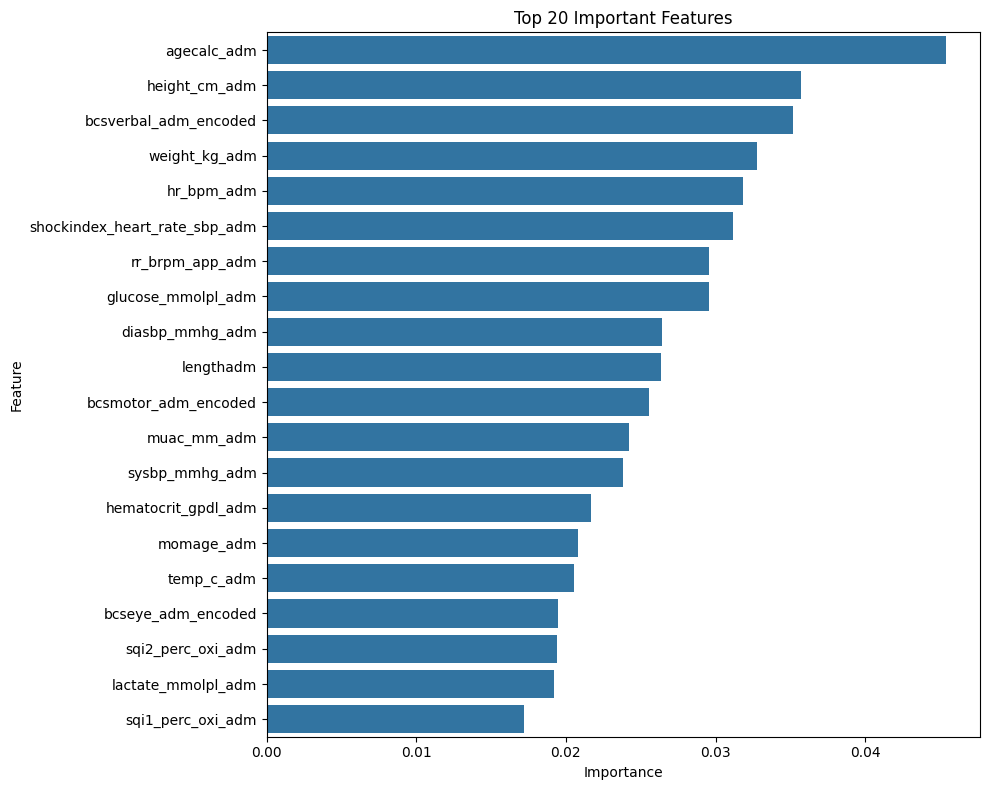

In [56]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

# Define features and target
X = df2.drop(columns='inhospital_mortality')
y = df2['inhospital_mortality']

# Label Encode all object columns
label_encoders = {}
for col in X.columns:
    if X[col].dtype == 'object' or X[col].dtype.name == 'category':
        le = LabelEncoder()
        X[col] = le.fit_transform(X[col].astype(str))  # Ensure everything is string
        label_encoders[col] = le

# Split into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Build Random Forest model
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

# Get feature importances
importances = rf.feature_importances_
feature_names = X.columns
feature_importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by="Importance", ascending=False)

# Display top 20 features
print(feature_importance_df.head(30))

# Plot top 20 feature importances
plt.figure(figsize=(10, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df.head(20))
plt.title('Top 20 Important Features')
plt.tight_layout()
plt.show()


*first try*

c:\Users\820 g4\VSCODE PYTHON PROJECTS\.venv\lib\site-packages\sklearn\base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(


Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.99      0.97       507
           1       0.17      0.03      0.05        31

    accuracy                           0.93       538
   macro avg       0.56      0.51      0.51       538
weighted avg       0.90      0.93      0.91       538

ROC-AUC Score: 0.6448


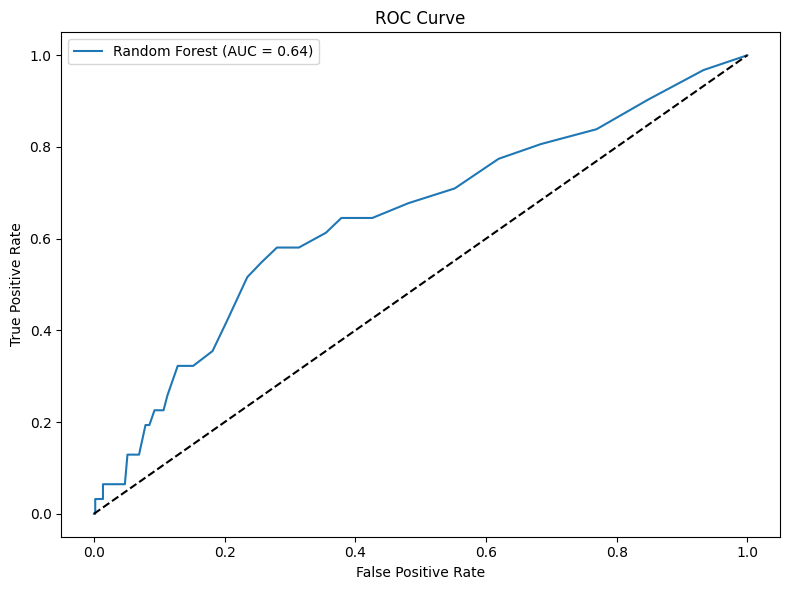

In [57]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, roc_auc_score, roc_curve, auc
from imblearn.over_sampling import SMOTE

# Select top 20 features
top_features =  [
    'agecalc_adm', 'bcsverbal_adm_encoded', 'height_cm_adm', 'weight_kg_adm',
    'rr_brpm_app_adm', 'hr_bpm_adm', 'glucose_mmolpl_adm', 'shockindex_heart_rate_sbp_adm',
    'lengthadm', 'diasbp_mmhg_adm', 'bcsmotor_adm_encoded', 'sysbp_mmhg_adm',
    'muac_mm_adm', 'temp_c_adm', 'momage_adm', 'lactate_mmolpl_adm',
    'bcseye_adm_encoded', 'hematocrit_gpdl_adm', 'sqi2_perc_oxi_adm', 'sqi1_perc_oxi_adm',
    'feedingstatus_adm_encoded', 'exclbreastfed_adm_encoded', 'momagefirstpreg_adm',
    'householdsize_adm', 'spo2site1_pc_oxi_adm', 'spo2onoxy_adm', 'spo2site2_pc_oxi_adm',
    'traveldist_adm_encoded', 'lightfuel_adm', 'deadchildren_adm'
]

# Define features and target
X = df2[top_features]
y = df2['inhospital_mortality']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


# Apply SMOTE to balance the training set
smote = SMOTE(random_state=42)
X_train_bal, y_train_bal = smote.fit_resample(X_train, y_train)

# Train Random Forest on balanced data
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train_bal, y_train_bal)

# Predict and evaluate
y_pred = rf.predict(X_test)
y_proba = rf.predict_proba(X_test)[:, 1]

# Classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# ROC-AUC Score
roc_auc = roc_auc_score(y_test, y_proba)
print(f"ROC-AUC Score: {roc_auc:.4f}")

# Plot ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_proba)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'Random Forest (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.tight_layout()
plt.show()


*testing for overfitting*


In [58]:
from sklearn.metrics import classification_report, roc_auc_score

# Predictions on training data
y_train_pred = rf.predict(X_train)
y_train_proba = rf.predict_proba(X_train)[:, 1]

print("Train ROC-AUC:", roc_auc_score(y_train, y_train_proba))
print(classification_report(y_train, y_train_pred))

# Already have test results


Train ROC-AUC: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2060
           1       1.00      1.00      1.00        88

    accuracy                           1.00      2148
   macro avg       1.00      1.00      1.00      2148
weighted avg       1.00      1.00      1.00      2148



c:\Users\820 g4\VSCODE PYTHON PROJECTS\.venv\lib\site-packages\sklearn\base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(


Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.99      0.97       514
           1       0.25      0.08      0.12        24

    accuracy                           0.95       538
   macro avg       0.60      0.54      0.55       538
weighted avg       0.93      0.95      0.94       538

ROC-AUC Score: 0.6483


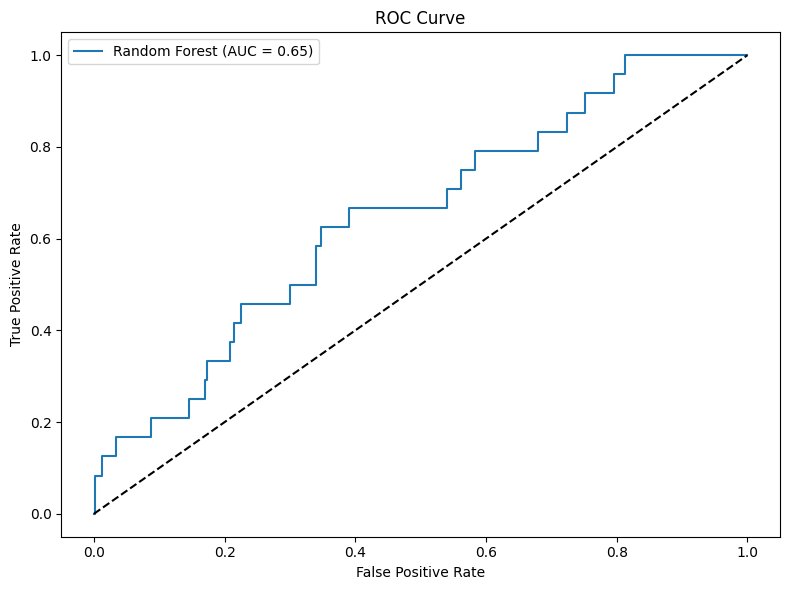

In [59]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, roc_auc_score, roc_curve
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt

# Top 30 features
top_30_features = [
    'agecalc_adm', 'bcsverbal_adm_encoded', 'height_cm_adm', 'weight_kg_adm',
    'rr_brpm_app_adm', 'hr_bpm_adm', 'glucose_mmolpl_adm', 'shockindex_heart_rate_sbp_adm',
    'lengthadm', 'diasbp_mmhg_adm', 'bcsmotor_adm_encoded', 'sysbp_mmhg_adm',
    'muac_mm_adm', 'temp_c_adm', 'momage_adm', 'lactate_mmolpl_adm',
    'bcseye_adm_encoded', 'hematocrit_gpdl_adm', 'sqi2_perc_oxi_adm', 'sqi1_perc_oxi_adm',
    'feedingstatus_adm_encoded', 'exclbreastfed_adm_encoded', 'momagefirstpreg_adm',
    'householdsize_adm', 'spo2site1_pc_oxi_adm', 'spo2onoxy_adm', 'spo2site2_pc_oxi_adm',
    'traveldist_adm_encoded', 'lightfuel_adm', 'deadchildren_adm'
]

# Define features and target
X = df2[top_30_features]
y = df2['inhospital_mortality']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# Apply SMOTE to balance the training set
smote = SMOTE(random_state=42)
X_train_bal, y_train_bal = smote.fit_resample(X_train, y_train)

# Train Random Forest on balanced data
rf = RandomForestClassifier(n_estimators=100,max_depth=10,
    min_samples_split=10,
    class_weight='balanced', random_state=42)

rf.fit(X_train_bal, y_train_bal)

# Predict and evaluate
y_pred = rf.predict(X_test)
y_proba = rf.predict_proba(X_test)[:, 1]

# Classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# ROC-AUC Score
roc_auc = roc_auc_score(y_test, y_proba)
print(f"ROC-AUC Score: {roc_auc:.4f}")

# Plot ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_proba)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'Random Forest (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.tight_layout()
plt.show()


*top best*


c:\Users\820 g4\VSCODE PYTHON PROJECTS\.venv\lib\site-packages\sklearn\base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(


Train ROC-AUC Score: 0.9968

Test Set Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.96      0.96       514
           1       0.22      0.25      0.24        24

    accuracy                           0.93       538
   macro avg       0.59      0.60      0.60       538
weighted avg       0.93      0.93      0.93       538

Test ROC-AUC Score: 0.6162


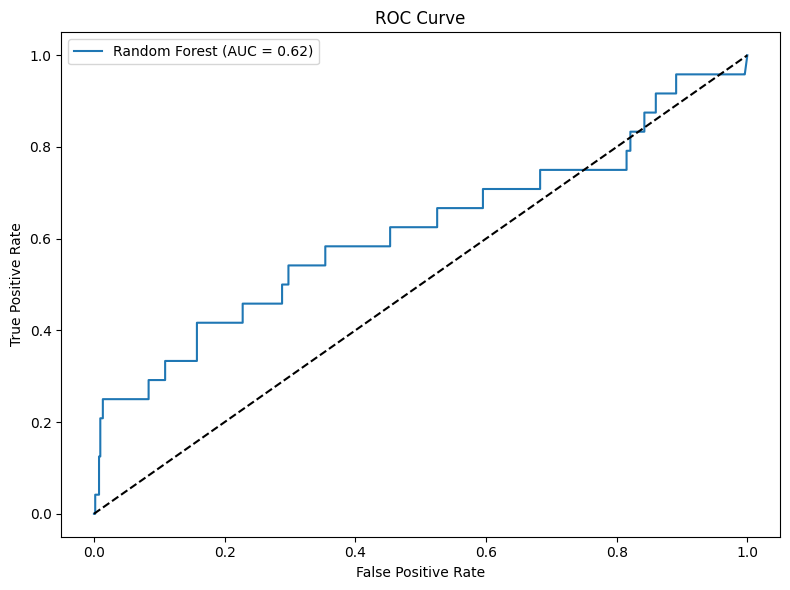

In [60]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, roc_auc_score, roc_curve
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt

# Top 10 features (renamed for clarity)
top_10_features = [
    'agecalc_adm', 'bcsverbal_adm_encoded', 'height_cm_adm', 'weight_kg_adm',
    'rr_brpm_app_adm', 'hr_bpm_adm', 'glucose_mmolpl_adm', 'shockindex_heart_rate_sbp_adm',
    'lengthadm', 'diasbp_mmhg_adm'
]

# Define features and target
X = df2[top_10_features]
y = df2['inhospital_mortality']

# Train-test split (stratified for class balance)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# Apply SMOTE to balance only the training set
smote = SMOTE(random_state=42)
X_train_bal, y_train_bal = smote.fit_resample(X_train, y_train)

# Train Random Forest on balanced training data
rf = RandomForestClassifier(
    n_estimators=100,
    max_depth=10,
    min_samples_split=10,
    class_weight='balanced',
    random_state=42
)
rf.fit(X_train_bal, y_train_bal)

# --- Evaluate on training set (optional, for overfitting check) ---
y_train_proba = rf.predict_proba(X_train)[:, 1]
train_auc = roc_auc_score(y_train, y_train_proba)
print(f"Train ROC-AUC Score: {train_auc:.4f}")

# --- Evaluate on test set ---
y_pred = rf.predict(X_test)
y_proba = rf.predict_proba(X_test)[:, 1]

print("\nTest Set Classification Report:")
print(classification_report(y_test, y_pred))

roc_auc = roc_auc_score(y_test, y_proba)
print(f"Test ROC-AUC Score: {roc_auc:.4f}")

# --- Plot ROC Curve ---
fpr, tpr, _ = roc_curve(y_test, y_proba)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'Random Forest (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.tight_layout()
plt.show()


*second best*


Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.99      0.98       514
           1       0.44      0.17      0.24        24

    accuracy                           0.95       538
   macro avg       0.70      0.58      0.61       538
weighted avg       0.94      0.95      0.94       538

ROC-AUC Score: 0.7096


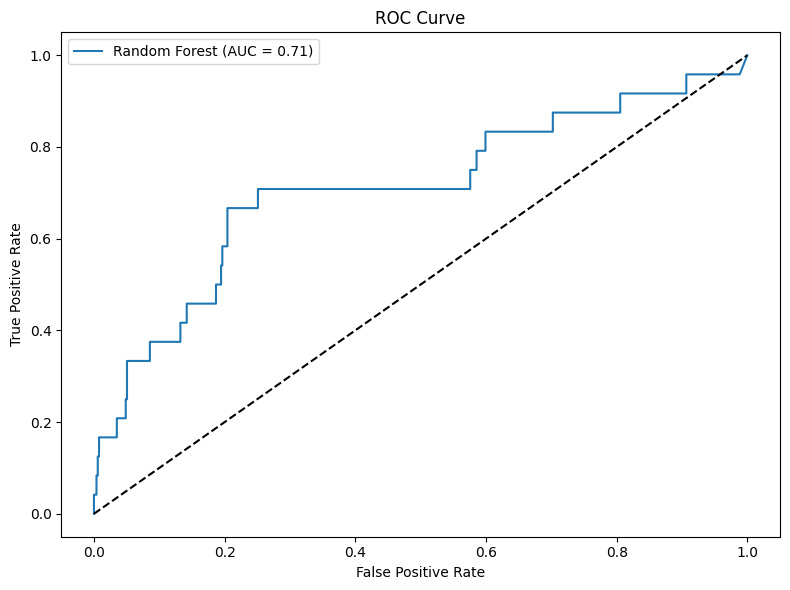

In [61]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, roc_auc_score, roc_curve
import matplotlib.pyplot as plt

# Top 10 features (as given)
top_30_features = [
    'agecalc_adm', 'bcsverbal_adm_encoded', 'height_cm_adm', 'weight_kg_adm',
    'rr_brpm_app_adm', 'hr_bpm_adm', 'glucose_mmolpl_adm', 'shockindex_heart_rate_sbp_adm',
    'lengthadm', 'diasbp_mmhg_adm'
]

# Define features and target
X = df2[top_30_features]
y = df2['inhospital_mortality']

# Train-test split (stratified to preserve class distribution)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# Train Random Forest with manually scaled positive class weight
rf = RandomForestClassifier(
    n_estimators=100,
    max_depth=10,
    min_samples_split=10,
    class_weight="balanced",  # manually increasing weight of positive class
    random_state=42
)

rf.fit(X_train, y_train)

# Predict and evaluate
y_pred = rf.predict(X_test)
y_proba = rf.predict_proba(X_test)[:, 1]

# Classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# ROC-AUC Score
roc_auc = roc_auc_score(y_test, y_proba)
print(f"ROC-AUC Score: {roc_auc:.4f}")

# Plot ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_proba)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'Random Forest (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.tight_layout()
plt.show()


In [62]:
print(df2.columns)

Index(['agecalc_adm', 'height_cm_adm', 'weight_kg_adm', 'muac_mm_adm',
       'hr_bpm_adm', 'rr_brpm_app_adm', 'sysbp_mmhg_adm', 'diasbp_mmhg_adm',
       'temp_c_adm', 'spo2site1_pc_oxi_adm',
       ...
       'bcsmotor_adm_encoded', 'exclbreastfed_adm_encoded',
       'oxygenavail_adm_encoded', 'bcsverbal_adm_encoded',
       'priorhosp_adm_encoded', 'totalbreastfed_adm_encoded',
       'bednet_adm_encoded', 'badhealthduration_adm_encoded',
       'caregiverage_adm_encoded', 'momedu_adm_encoded'],
      dtype='object', length=115)


c:\Users\820 g4\VSCODE PYTHON PROJECTS\.venv\lib\site-packages\sklearn\base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(


Train ROC-AUC Score: 0.9890

Test Set Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.98      0.97       514
           1       0.08      0.04      0.06        24

    accuracy                           0.94       538
   macro avg       0.52      0.51      0.51       538
weighted avg       0.92      0.94      0.93       538

Test ROC-AUC Score: 0.6858


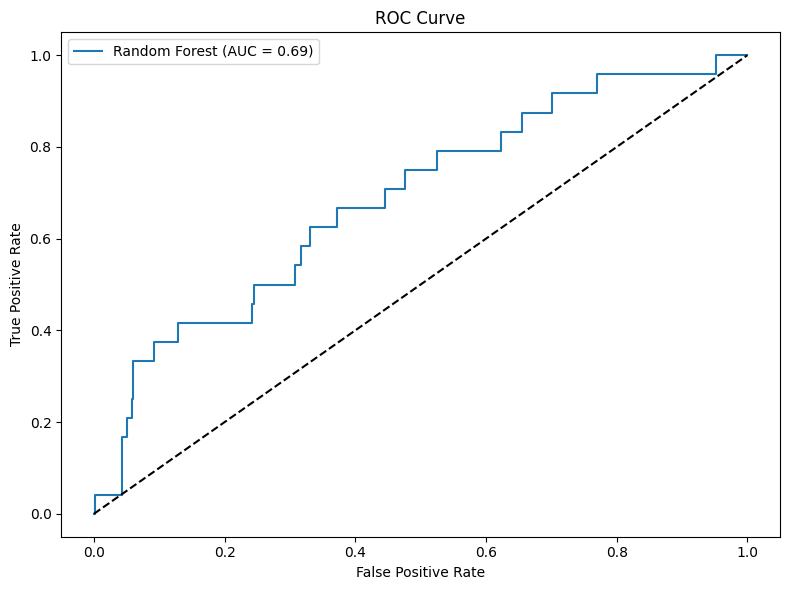

In [63]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, roc_auc_score, roc_curve
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt

# Top features (renamed for clarity)
top_features = [
    # Demographics & Vitals
    "agecalc_adm", "sex_adm", "height_cm_adm", "weight_kg_adm", "muac_mm_adm",
    "hr_bpm_adm", "rr_brpm_app_adm", "sysbp_mmhg_adm", "diasbp_mmhg_adm",
    "temp_c_adm", "spo2site1_pc_oxi_adm", "spo2onoxy_adm", "oxygenavail_adm_encoded",

    # Clinical Signs & Severity
    "respdistress_adm", "caprefill_adm",
    "bcseye_adm_encoded", "bcsmotor_adm_encoded", "bcsverbal_adm_encoded",

    # Vaccination & Medication History
    "bcgscar_adm", "vaccmeasles_adm", "vaccpneumoc_adm_encoded", "vaccdpt_adm_encoded",
    "priorweekabx_adm", "priorweekantimal_adm",

    # Comorbidity
    "comorbidity_adm___10",
    "comorbidity_adm___12",  
    "comorbidity_adm___11"
]


# Define features and target
X = df2[top_features]
y = df2['inhospital_mortality']

# Train-test split (stratified for class balance)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# Apply SMOTE to balance only the training set
smote = SMOTE(random_state=42)
X_train_bal, y_train_bal = smote.fit_resample(X_train, y_train)

# Train Random Forest on balanced training data
rf = RandomForestClassifier(
    n_estimators=100,
    max_depth=10,
    min_samples_split=10,
    class_weight='balanced',
    random_state=42
)
rf.fit(X_train_bal, y_train_bal)

# --- Evaluate on training set (optional, for overfitting check) ---
y_train_proba = rf.predict_proba(X_train)[:, 1]
train_auc = roc_auc_score(y_train, y_train_proba)
print(f"Train ROC-AUC Score: {train_auc:.4f}")

# --- Evaluate on test set ---
y_pred = rf.predict(X_test)
y_proba = rf.predict_proba(X_test)[:, 1]

print("\nTest Set Classification Report:")
print(classification_report(y_test, y_pred))

roc_auc = roc_auc_score(y_test, y_proba)
print(f"Test ROC-AUC Score: {roc_auc:.4f}")

# --- Plot ROC Curve ---
fpr, tpr, _ = roc_curve(y_test, y_proba)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'Random Forest (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.tight_layout()
plt.show()
